### RNAPuzzle test for modified loss

In [6]:
import os

os.chdir("/home/adamczykb/rnaquanet/src")
from rnaquanet.dataset.RNAQuANetDataset import RNAQuANetDataset
import torch
import torch.nn as nn
from torch_geometric import nn as gnn
import lightning as L
from pdbfixer import PDBFixer
from openmm.app import PDBFile
from Bio import PDB
import numpy as np
import pandas as pd
import scipy.stats as stats
from matplotlib import pyplot as plt

### Model

In [7]:
class RNAQuANet(L.LightningModule):
    def __init__(self, number_of_node_features: int,number_of_edge_features: int):
        super().__init__()
        self.save_hyperparameters()
        self.norm1 = gnn.BatchNorm(number_of_node_features)

        self.GATconv1 = gnn.GATv2Conv(
            number_of_node_features, number_of_node_features, heads=4, edge_dim=number_of_edge_features
        )

        self.GATconv2 = gnn.GATv2Conv(
            number_of_node_features * 4, number_of_node_features, heads=4, edge_dim=number_of_edge_features
        )
        self.GATconv3 = gnn.GATv2Conv(
            number_of_node_features * 4, number_of_node_features, heads=4, edge_dim=number_of_edge_features
        )

        self.GCN2Conv1 = gnn.GeneralConv(
            number_of_node_features * 4, number_of_node_features, in_edge_channels=number_of_edge_features
        )

        self.fc1 = nn.Linear(number_of_node_features, number_of_node_features)
        self.fc3 = nn.Linear(number_of_node_features, 1)
        self.dropout = nn.Dropout(0.3)
        self.activation = nn.LeakyReLU()
        self.activationlast = nn.ReLU()
        self.aggregation = gnn.aggr.SetTransformerAggregation(
            number_of_node_features, dropout=0.3, layer_norm=True
        )

    def forward(self, x, edge_index, edge_attr, batch):

        y = self.norm1(x)
        y = self.GATconv1(y, edge_index, edge_attr)
        y = self.activation(y)
        y = self.dropout(y)
        y = self.GATconv2(y, edge_index, edge_attr)
        y = self.activation(y)
        y = self.dropout(y)
        y = self.GATconv3(y, edge_index, edge_attr)
        y = self.activation(y)
        y = self.dropout(y)
        y = self.GCN2Conv1(y, edge_index, edge_attr)
        y = self.activation(y)
        y = self.dropout(y)

        y = self.aggregation(y, batch)

        y = self.fc1(y)
        y = self.activation(y)
        y = self.dropout(y)

        y = self.fc3(y)

        return self.activationlast(y)

    def training_step(self, data, batch_idx):
        s1, s2 = data
        result_1 = self.forward(s1.x, s1.edge_index, s1.edge_attr, s1.batch)
        result_2 = self.forward(s2.x, s2.edge_index, s2.edge_attr, s2.batch)

        loss_mae_s1 = (torch.abs(result_1 - s1.y.unsqueeze(-1))).mean()
        loss_mae_s2 = (torch.abs(result_2 - s2.y.unsqueeze(-1))).mean()
        loss_mse_s1 = (torch.square(torch.abs(result_1 - s1.y.unsqueeze(-1)))).mean()
        loss_mse_s2 = (torch.square(torch.abs(result_2 - s2.y.unsqueeze(-1)))).mean()

        self.log("train_loss_mae", (loss_mae_s1 + loss_mae_s2) / 2)
        self.log("train_loss_mse", (loss_mse_s1 + loss_mse_s2) / 2)
        loss = (loss_mae_s1 + loss_mae_s2) / 2
        result_1 = result_1[0]
        result_2 = result_2[0]
        if s1.y[0] < s2.y[0]:
            if result_1 > result_2:
                loss = loss + 1
        else:
            if result_1 < result_2:
                loss = loss + 1
        self.log("train_loss_mod", loss, batch_size=125)
        return loss

    def validation_step(self, data, batch_idx):
        s1, s2 = data
        result_1 = self.forward(s1.x, s1.edge_index, s1.edge_attr, s1.batch)
        result_2 = self.forward(s2.x, s2.edge_index, s2.edge_attr, s2.batch)

        loss_mae_s1 = (torch.abs(result_1 - s1.y.unsqueeze(-1))).mean()
        loss_mae_s2 = (torch.abs(result_2 - s2.y.unsqueeze(-1))).mean()
        loss_mse_s1 = (torch.square(torch.abs(result_1 - s1.y.unsqueeze(-1)))).mean()
        loss_mse_s2 = (torch.square(torch.abs(result_2 - s2.y.unsqueeze(-1)))).mean()

        self.log("val_loss_mae", (loss_mae_s1 + loss_mae_s2) / 2)
        self.log("val_loss_mse", (loss_mse_s1 + loss_mse_s2) / 2)

        loss = (loss_mae_s1 + loss_mae_s2) / 2
        result_1 = result_1[0]
        result_2 = result_2[0]
        if s1.y[0] < s2.y[0]:
            if result_1 > result_2:
                loss = loss + 1
        else:
            if result_1 < result_2:
                loss = loss + 1
        self.log("val_loss_mod", loss, batch_size=125)
        return loss

    def backward(self, loss):
        loss.backward()

    def configure_optimizers(self):
        optimizer = torch.optim.Adam(self.parameters(), lr=1e-4)
        return optimizer





In [8]:
dataset_test = RNAQuANetDataset(
    f"/home/adamczykb/rnaquanet/data/06_model_input/rnapuzzle_less_features",test=True
)

In [9]:
import subprocess
import json
import tempfile
import requests

def get_parser():
    """
    Returns a dictionary with non-standard base parsers.
    """
   



    parser = dict()
    res = requests.get("https://rna.bgsu.edu/modified/modified_to_change_data.json")
    p_file = ""
    with tempfile.NamedTemporaryFile(suffix=".json", delete=False) as par:
        par.write(res.content)
        p_file = par.name
    with open(p_file, "r") as par_f:
        parser = json.load(par_f)
    parser["DU"] = {"standard_base": ["U"]}
    parser["N"] = {"standard_base": ["*"]}
    parser["ADP"] = {"standard_base": ["A"]}
    parser["UFT"] = {"standard_base": ["U"]}
    return parser

def fix(path):
    non_standard = [
        "A23",
        "A2L",
        "A2M",
        "A39",
        "A3P",
        "A44",
        "A5O",
        "A6A",
        "A7E",
        "A9Z",
        "ADI",
        "ADP",
        "AET",
        "AMD",
        "AMO",
        "AP7",
        "AVC",
        "MA6",
        "MAD",
        "MGQ",
        "MIA",
        "MTU",
        "M7A",
        "26A",
        "2MA",
        "6IA",
        "6MA",
        "6MC",
        "6MP",
        "6MT",
        "6MZ",
        "6NW",
        "F3N",
        "N79",
        "RIA",
        "V3L",
        "ZAD",
        "31H",
        "31M",
        "7AT",
        "O2Z",
        "SRA",
        "00A",
        "45A",
        "8AN",
        "LCA",
        "P5P",
        "PPU",
        "PR5",
        "PU",
        "T6A",
        "TBN",
        "TXD",
        "TXP",
        "12A",
        "1MA",
        "5FA",
        "A6G",
        "E6G",
        "E7G",
        "EQ4",
        "IG",
        "IMP",
        "M2G",
        "MGT",
        "MGV",
        "MHG",
        "QUO",
        "YG",
        "YYG",
        "23G",
        "2EG",
        "2MG",
        "2SG",
        "B8K",
        "B8W",
        "B9B",
        "BGH",
        "N6G",
        "RFJ",
        "ZGU",
        "7MG",
        "CG1",
        "G1G",
        "G25",
        "G2L",
        "G46",
        "G48",
        "G7M",
        "GAO",
        "GDO",
        "GDP",
        "GH3",
        "GNG",
        "GOM",
        "GRB",
        "GTP",
        "KAG",
        "KAK",
        "O2G",
        "OMG",
        "8AA",
        "8OS",
        "LG",
        "PGP",
        "P7G",
        "TPG",
        "TG",
        "XTS",
        "102",
        "18M",
        "1MG",
        "A5M",
        "A6C",
        "E3C",
        "IC",
        "M4C",
        "M5M",
        "6OO",
        "B8Q",
        "B8T",
        "B9H",
        "JMH",
        "N5M",
        "RPC",
        "RSP",
        "RSQ",
        "ZBC",
        "ZCY",
        "73W",
        "C25",
        "C2L",
        "C31",
        "C43",
        "C5L",
        "CBV",
        "CCC",
        "CH",
        "CSF",
        "OMC",
        "S4C",
        "4OC",
        "LC",
        "LHH",
        "LV2",
        "PMT",
        "TC",
        "10C",
        "1SC",
        "5HM",
        "5IC",
        "5MC",
        "A6U",
        "IU",
        "I4U",
        "MEP",
        "MNU",
        "U25",
        "U2L",
        "U2P",
        "U31",
        "U34",
        "U36",
        "U37",
        "U8U",
        "UAR",
        "UBB",
        "UBD",
        "UD5",
        "UPV",
        "UR3",
        "URD",
        "US5",
        "UZR",
        "UMO",
        "U23",
        "2AU",
        "2MU",
        "2OM",
        "B8H",
        "FHU",
        "FNU",
        "F2T",
        "RUS",
        "ZBU",
        "3AU",
        "3ME",
        "3MU",
        "3TD",
        "70U",
        "75B",
        "CNU",
        "OMU",
        "ONE",
        "S4U",
        "SSU",
        "SUR",
        "4SU",
        "85Y",
        "DHU",
        "H2U",
        "LHU",
        "PSU",
        "PYO",
        "P4U",
        "T31",
        "125",
        "126",
        "127",
        "1RN",
        "5BU",
        "5FU",
        "5MU",
        "9QV",
        "5GP",
        "GTA",
        "F86",
        "I",
        "ATP",
        "DOC",
        "GMP",
        "GP3",
        "CSL",
        "M7G",
        "C5P",
        "RY",
        "LCC",
        "AMP",
        "G5J",
        "CFL",
        "UFT",
    ]
    class REMOVEOP11OP2FirstSelect(PDB.Select):
        def __init__(self):
            pass

        def accept_atom(self, atom):
            if atom.get_parent().get_id()[1] == 1:
                return atom.get_name() not in ["OP1", "OP2"]
            else:
                return True

    fixer = PDBFixer(filename=path)
    fixer.findNonstandardResidues()
    fixer.missingResidues = {}
    fixer.nonstandardResidues = list(
        [
            (i, get_parser()[i.name]["standard_base"][0])
            for i in fixer.topology.residues()
            if i.name in non_standard
        ]
    )
    fixer.replaceNonstandardResidues()
    fixer.findMissingAtoms()
    fixer.addMissingAtoms()
    PDBFile.writeFile(fixer.topology, fixer.positions, open(path, "w"))
    ref = PDB.PDBParser(QUIET=True).get_structure("str", path)[0]
    ref = ref[[i.id for i in ref][0]]
    io = PDB.PDBIO()
    io.set_structure(ref)
    io.save(
        path,
        REMOVEOP11OP2FirstSelect(),
    )
    task = subprocess.Popen(
        f"rna_pdb_tools.py --get-rnapuzzle-ready {path} --inplace".split(),
        stderr=subprocess.PIPE,
        stdout=subprocess.PIPE,
    )
    r, e = task.communicate()
    if task.returncode != 0:
        raise ValueError(f"rna_pdb_tools failed {path}" + e.decode("utf-8"))

In [10]:
checkpoint_paths = [
    {
        "best_model_path": '/home/adamczykb/rnaquanet/checkpoints/RNAQuANet-lociparse_less_features_dataset__all_tuplet/370595680354796830/76cd101af9b7429aa971c308fc5475d3/checkpoints/epoch=4-step=26505.ckpt',
        "dataset": "Lociparse less features, contrastive loss",
    },
]
base_path = "/home/adamczykb/rnaquanet/results/rnapuzzle/rnaquanet_modified_loss_less_features_contrastive"

In [11]:
def predict_and_save_results(dataset_test, best_model_path):
    val_model = RNAQuANet.load_from_checkpoint(
        best_model_path,
        number_of_node_features=dataset_test[0].x.shape[1],
        strict=False,
    )
    val_model = val_model.eval()
    res_inter = []
    for n, i in enumerate(dataset_test):
    
        res_inter.append(
            [
                i.x.shape[0],
                float(
                    val_model(
                        i.x.cuda(),
                        i.edge_index.cuda(),
                        i.edge_attr.cuda(),
                        torch.zeros(i.x.shape[0], dtype=torch.int64).cuda(),
                    )
                    .detach()
                    .cpu()
                    .numpy()
                ),
                dataset_test.structures[n].split(".")[0],
            ]
        )
    return pd.DataFrame(np.array(res_inter), columns=["length", "error", "name"])

'Testing Lociparse less features, contrastive loss with model /home/adamczykb/rnaquanet/checkpoints/RNAQuANet-lociparse_less_features_dataset__all_tuplet/370595680354796830/76cd101af9b7429aa971c308fc5475d3/checkpoints/epoch=4-step=26505.ckpt'

/tmp/ipykernel_577780/3510845769.py:14: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  float(


'GLOBAL'

'MAE: 9.485803901583692'

'MSE: 132.2786947721334'

'MEDIAN: 8.858017325401306'

/tmp/ipykernel_577780/1234856283.py:55: FutureWarning: The behavior of DataFrame concatenation with empty or all-NA entries is deprecated. In a future version, this will no longer exclude empty or all-NA columns when determining the result dtypes. To retain the old behavior, exclude the relevant entries before the concat operation.
  final_summary = pd.concat(


'PUZZLE: 7'

'MAE: 22.087689610627983'

'MSE: 517.1620062097477'

'MEDIAN: 21.682904481887817'

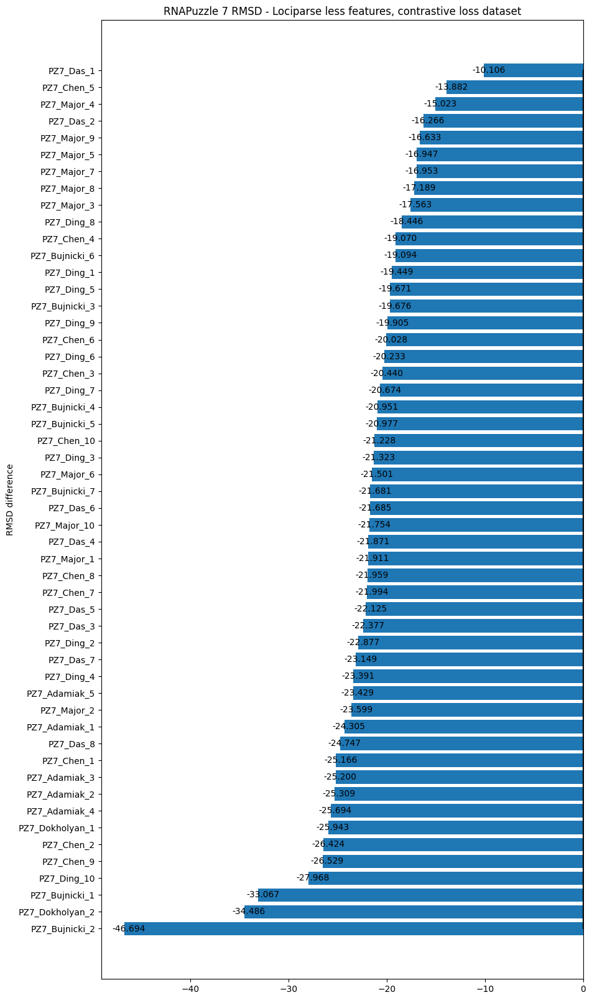

None

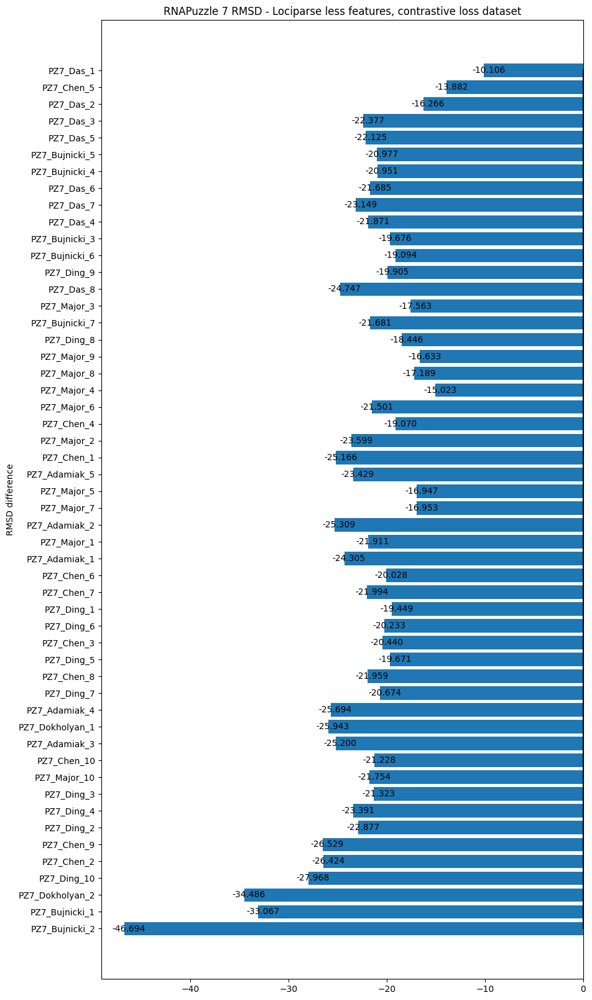

None

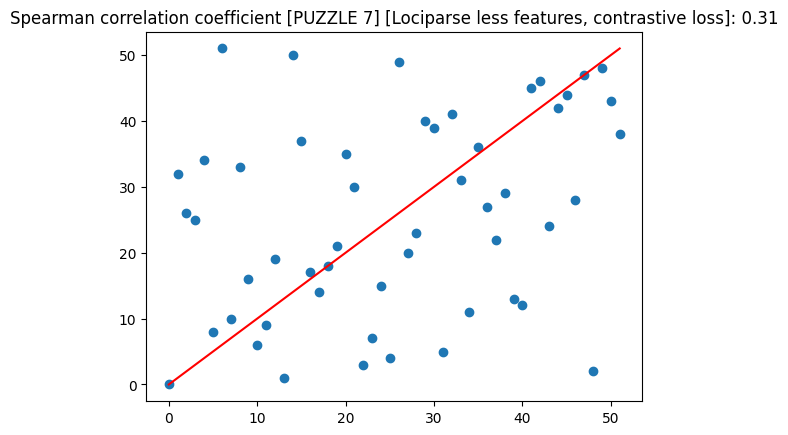

None

'PUZZLE: 35'

'MAE: 12.1542842762143'

'MSE: 181.59279480108117'

'MEDIAN: 13.656976699829105'

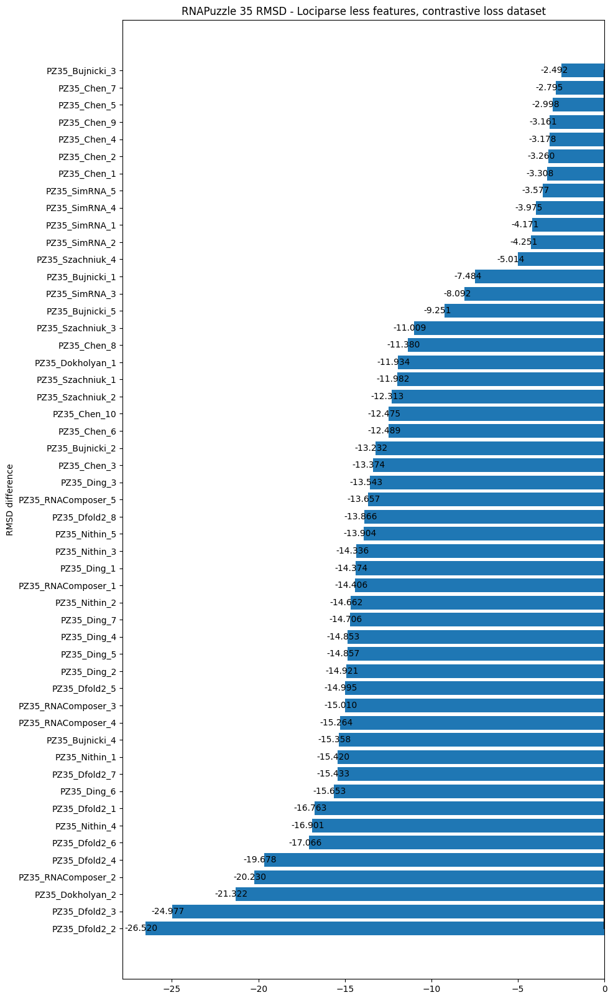

None

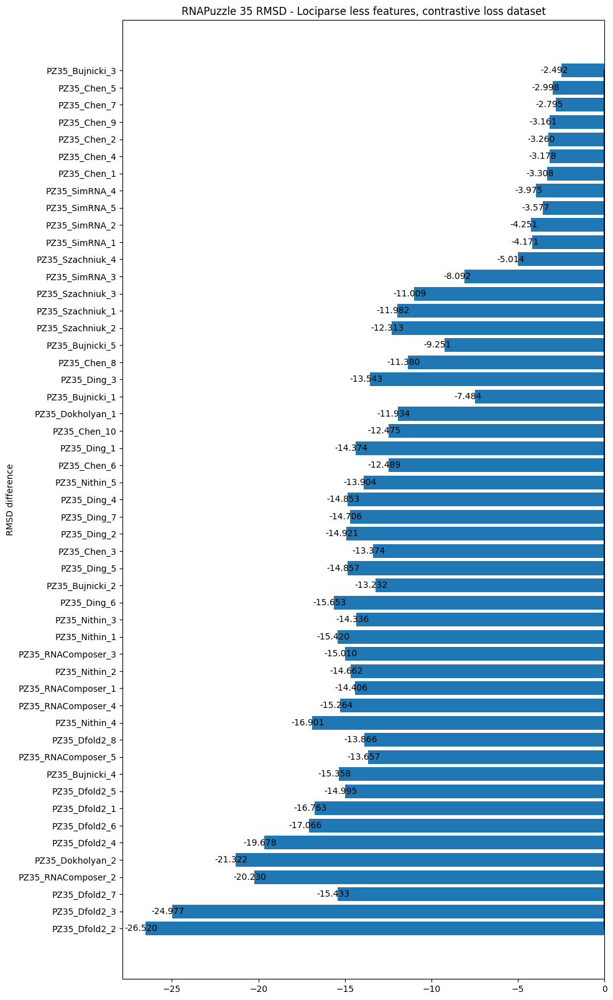

None

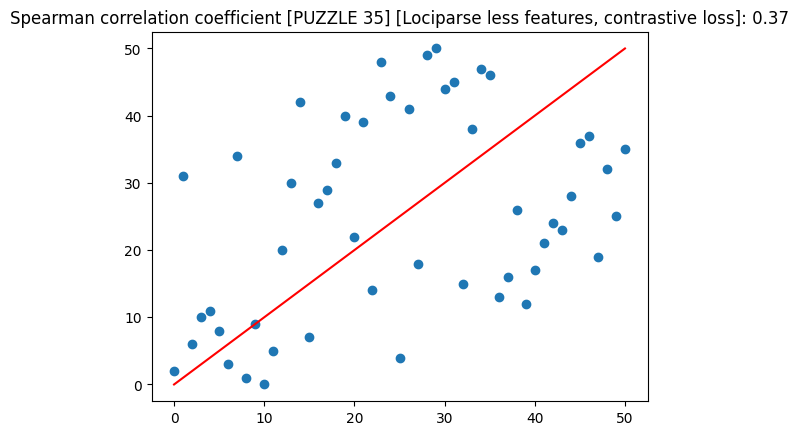

None

'PUZZLE: 32'

'MAE: 11.343566650489592'

'MSE: 166.8667549977285'

'MEDIAN: 9.89041519165039'

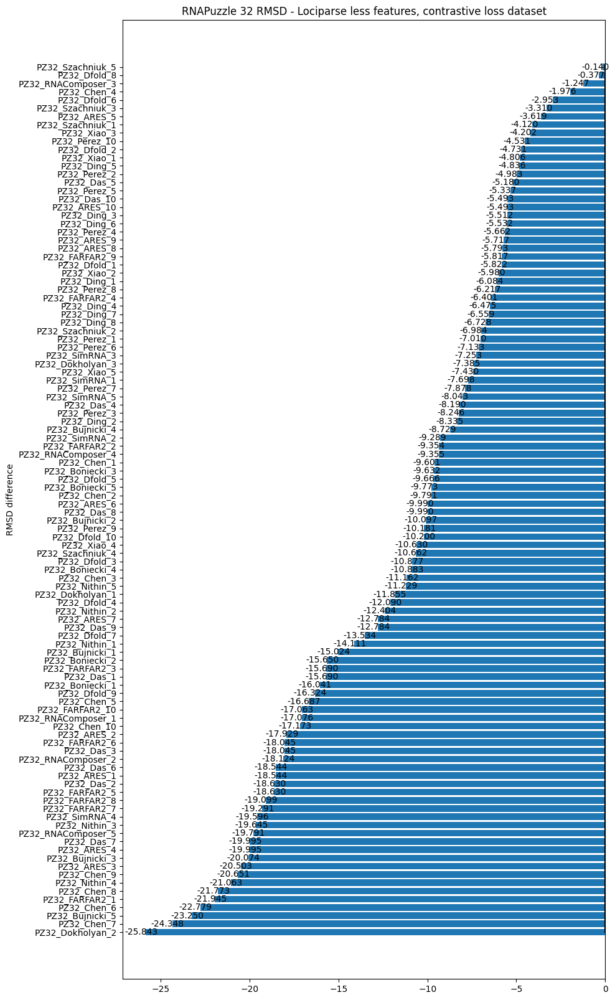

None

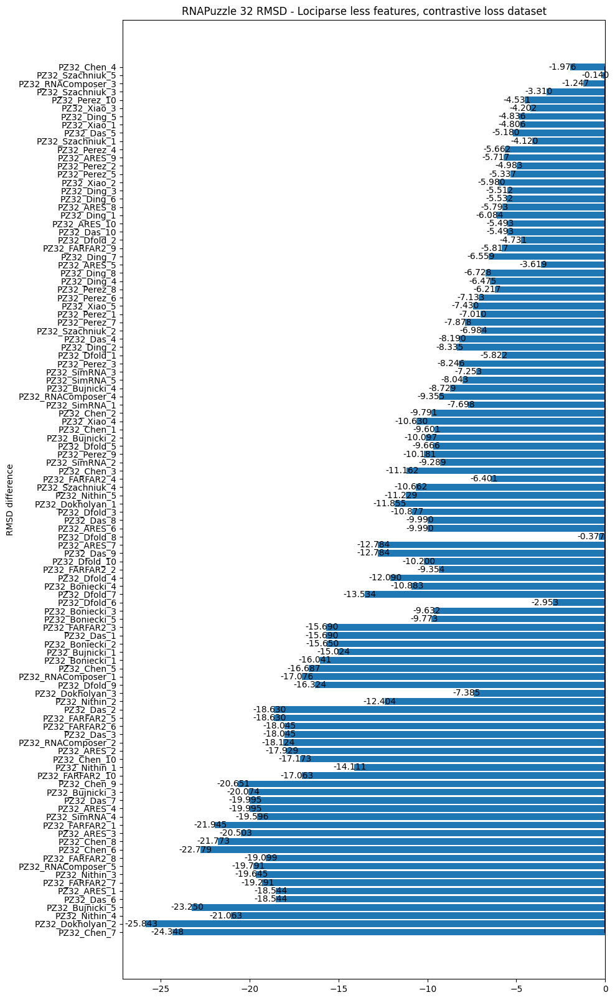

None

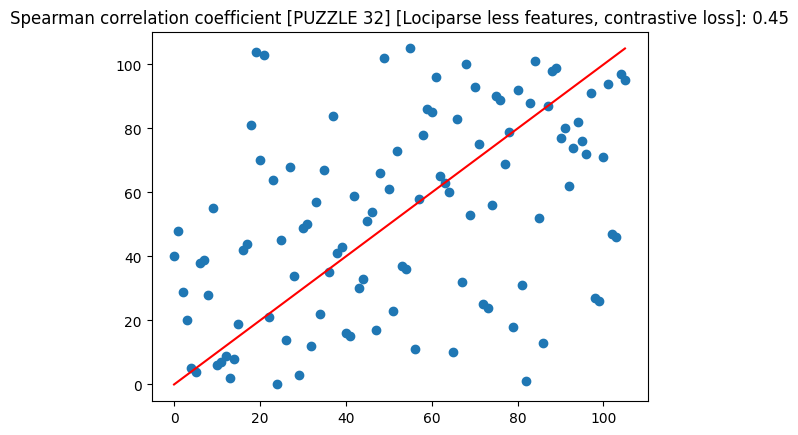

None

'PUZZLE: 22'

'MAE: 20.003873723745347'

'MSE: 411.8947094652598'

'MEDIAN: 20.492915630340576'

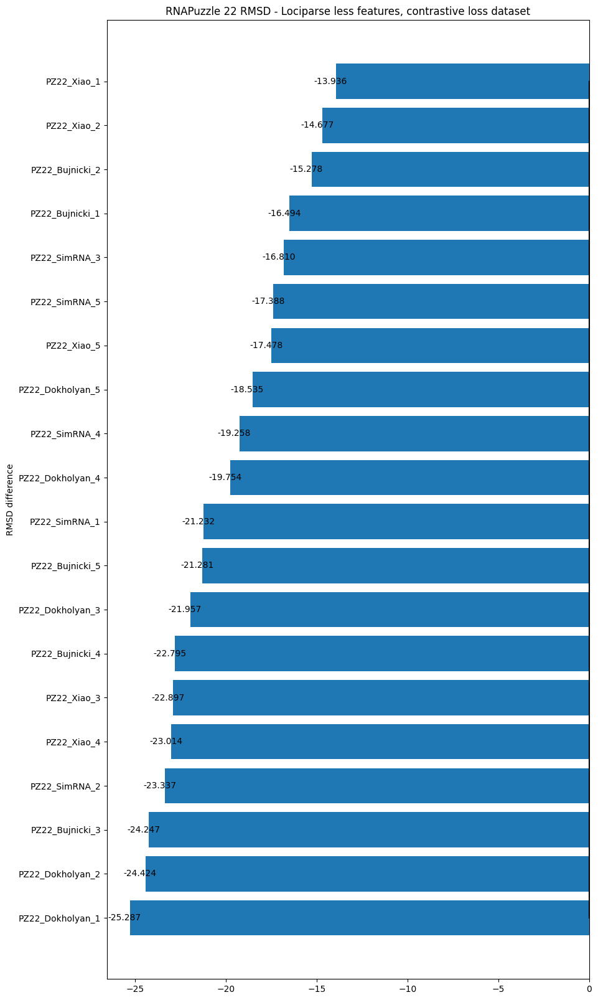

None

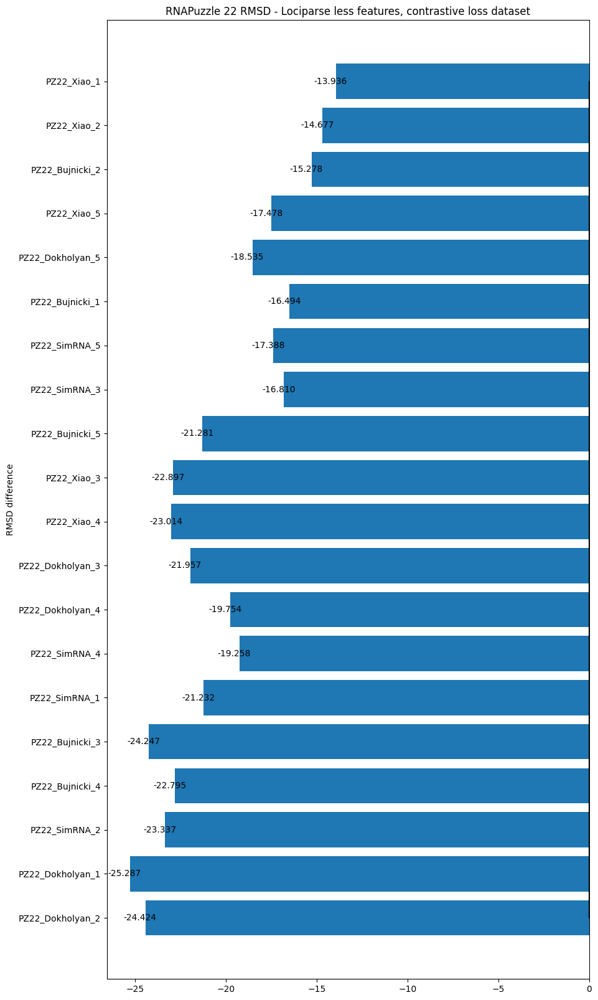

None

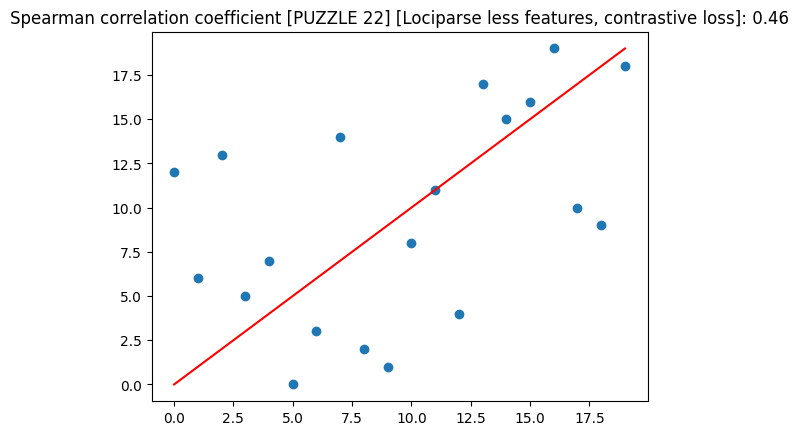

None

'PUZZLE: 8'

'MAE: 10.258365773019337'

'MSE: 122.85131119819545'

'MEDIAN: 9.35036301612854'

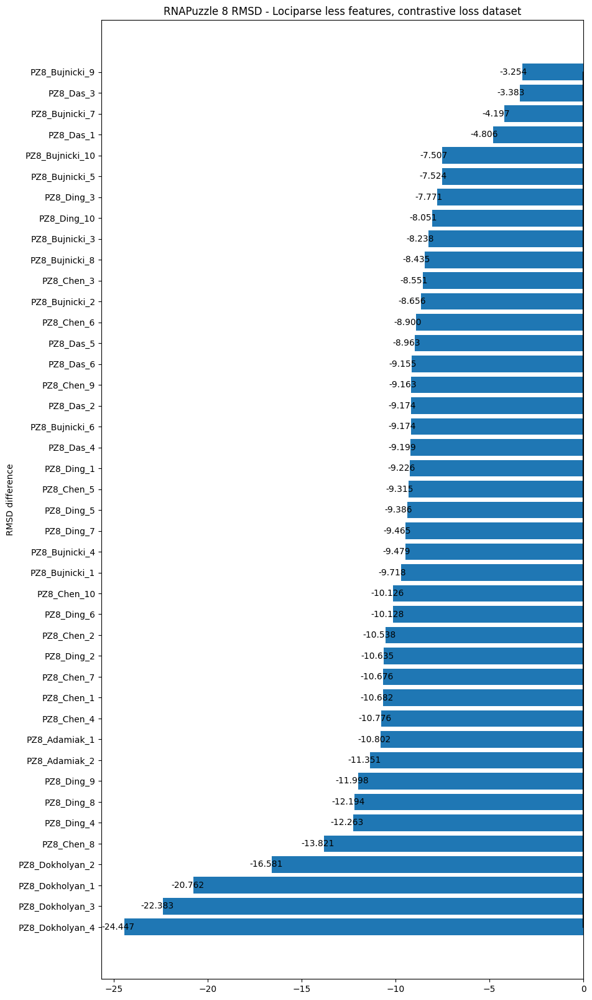

None

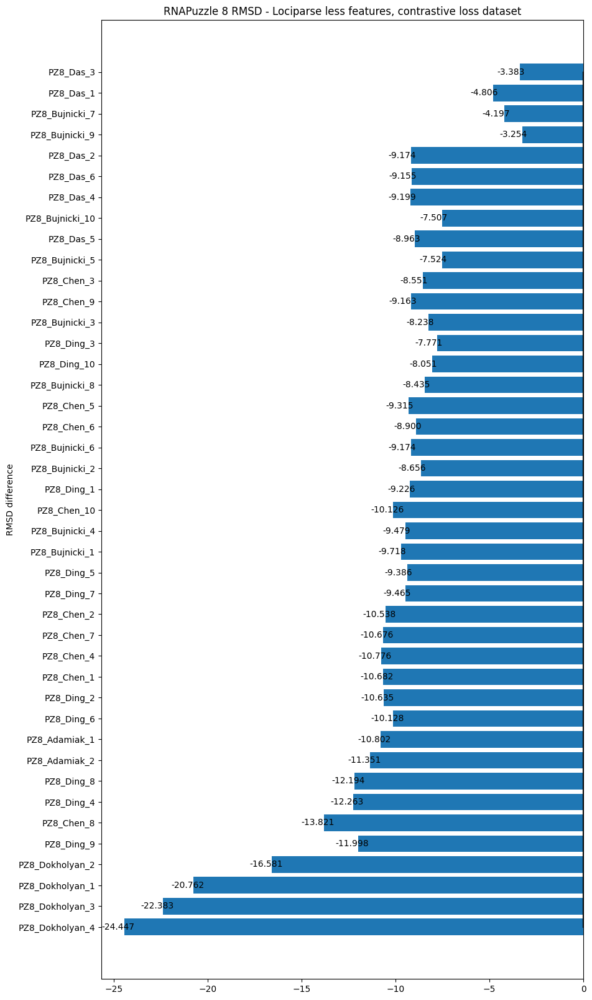

None

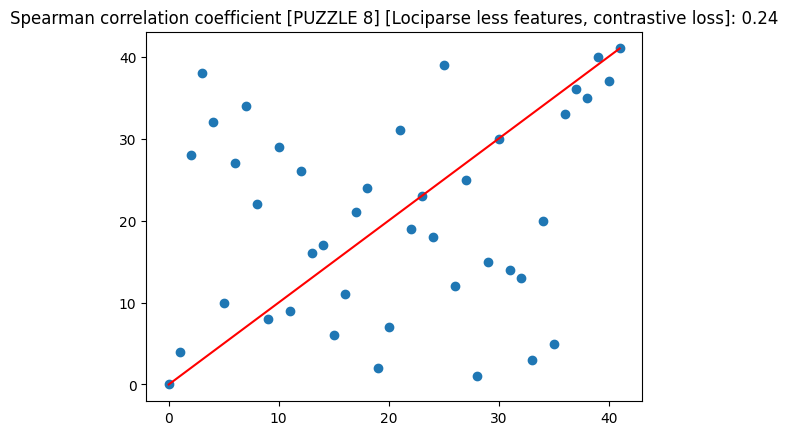

None

'PUZZLE: 25'

'MAE: 3.513576109358605'

'MSE: 26.26373474591095'

'MEDIAN: 2.5401687622070312'

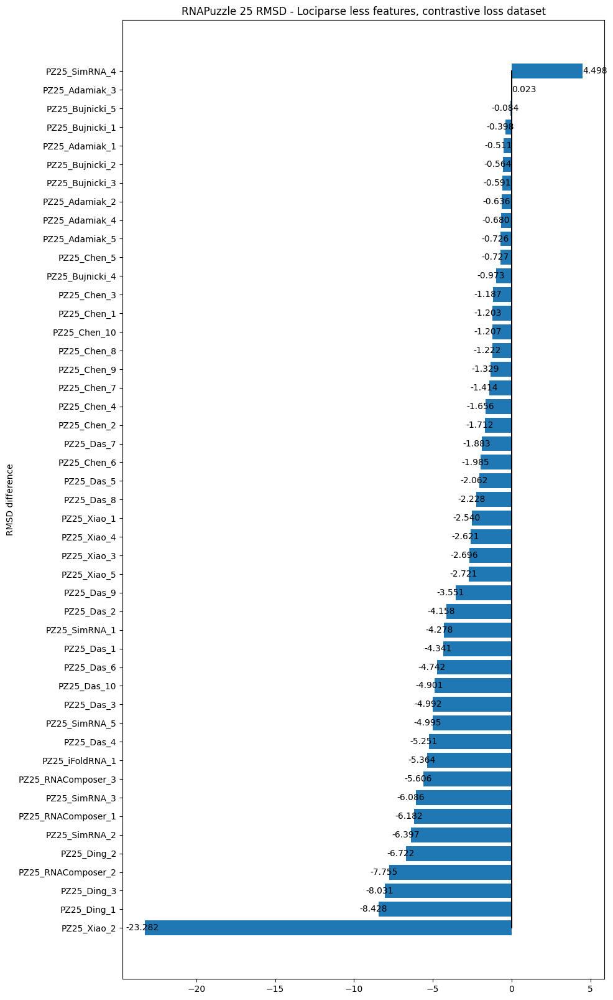

None

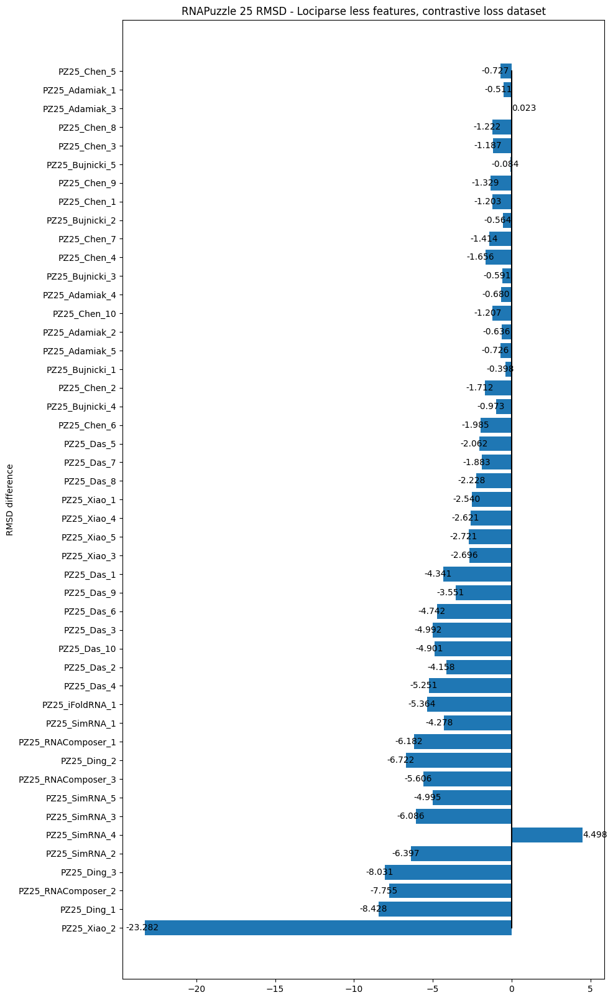

None

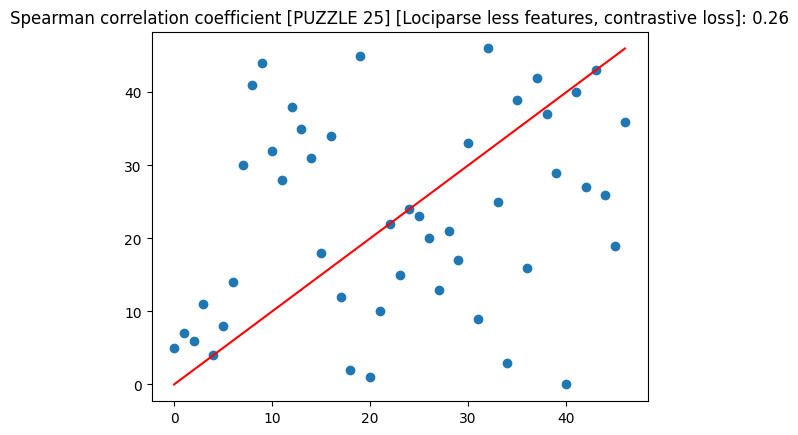

None

'PUZZLE: 37'

'MAE: 12.097613560452182'

'MSE: 169.47423155322585'

'MEDIAN: 11.860339641571045'

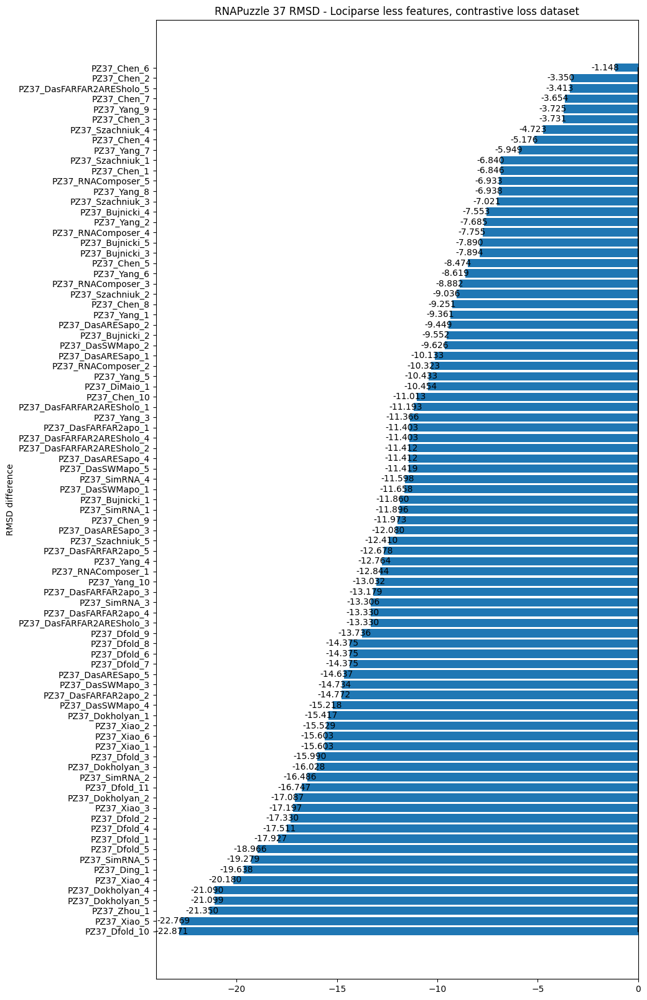

None

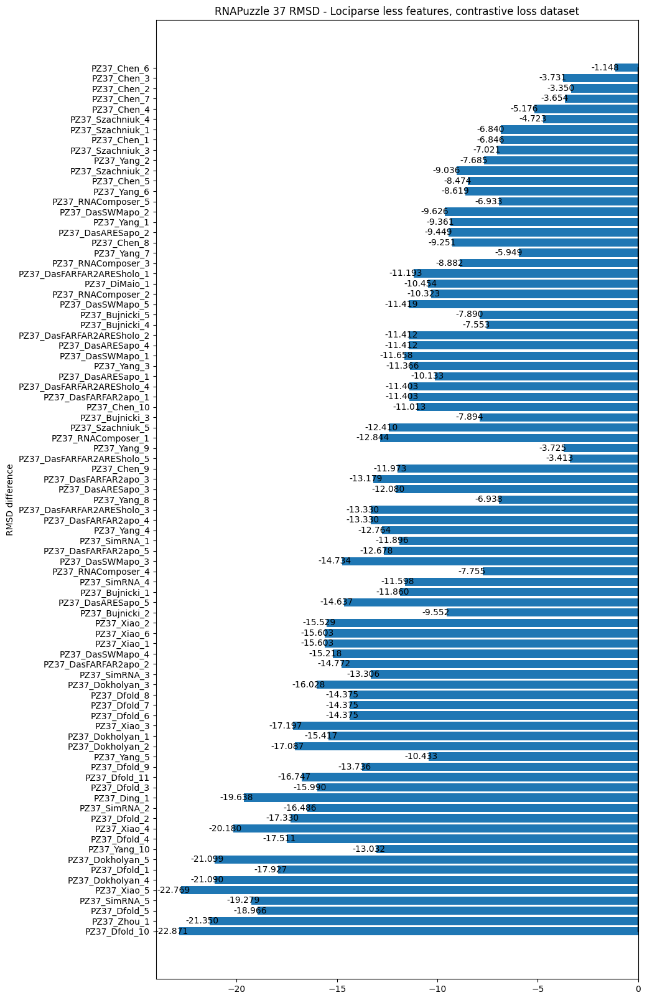

None

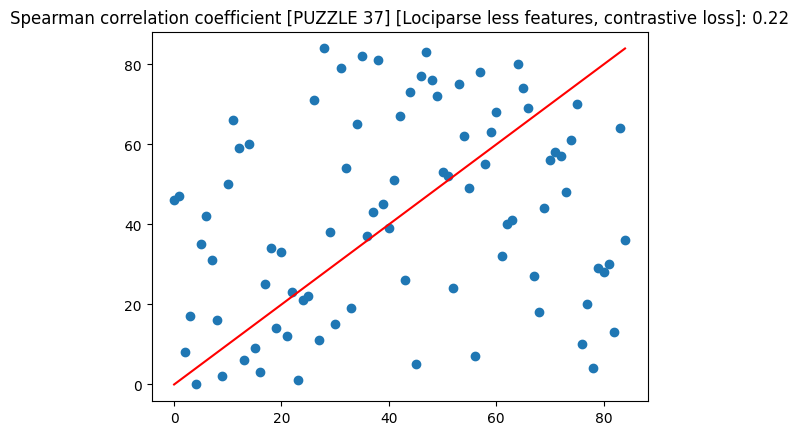

None

'PUZZLE: 18'

'MAE: 11.674932356803648'

'MSE: 174.16601221865434'

'MEDIAN: 12.127102553844452'

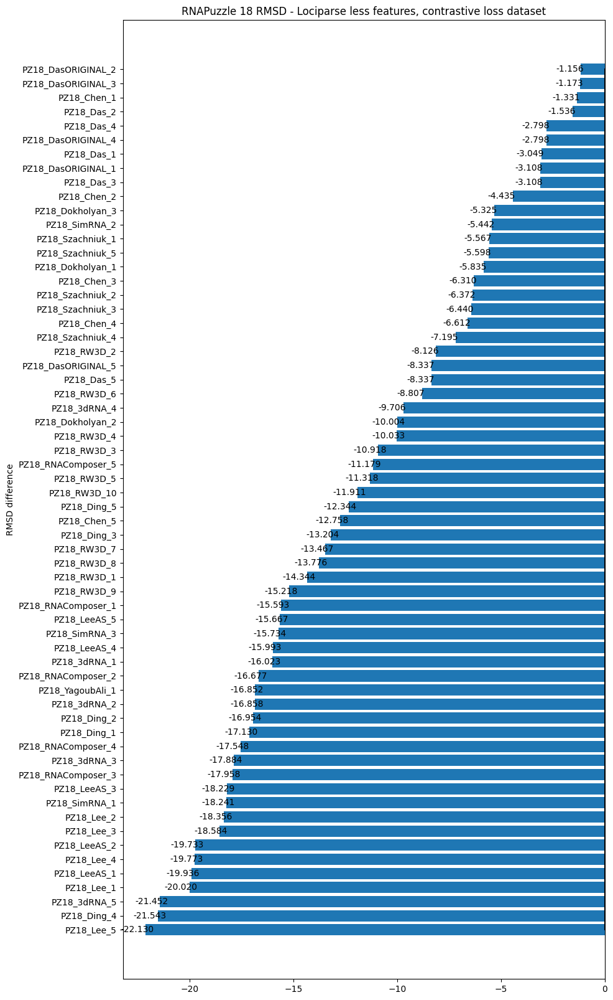

None

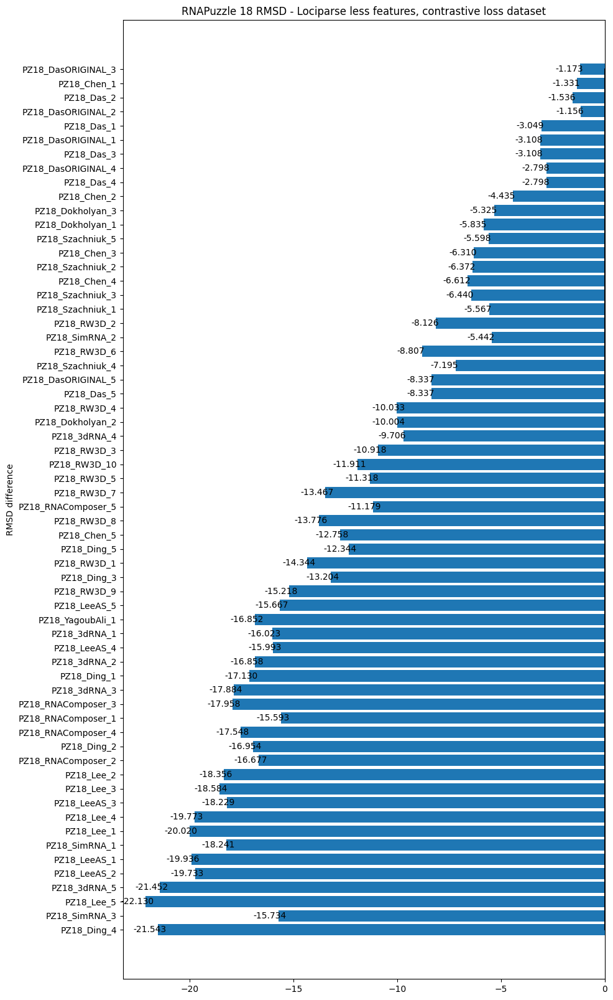

None

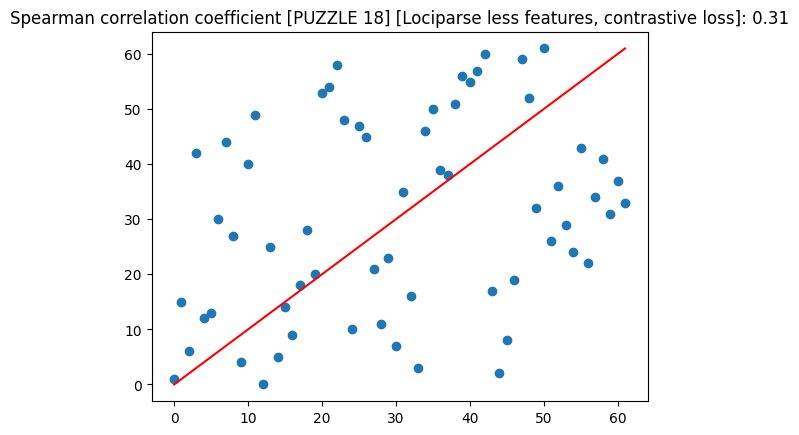

None

'PUZZLE: 9'

'MAE: 7.383098963428946'

'MSE: 76.4893037561919'

'MEDIAN: 6.621097683906556'

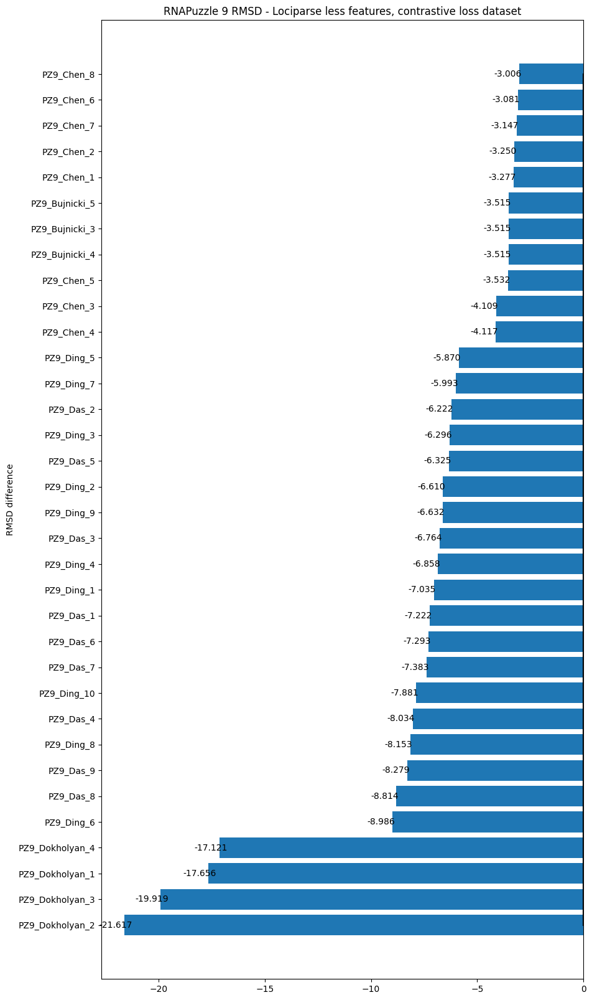

None

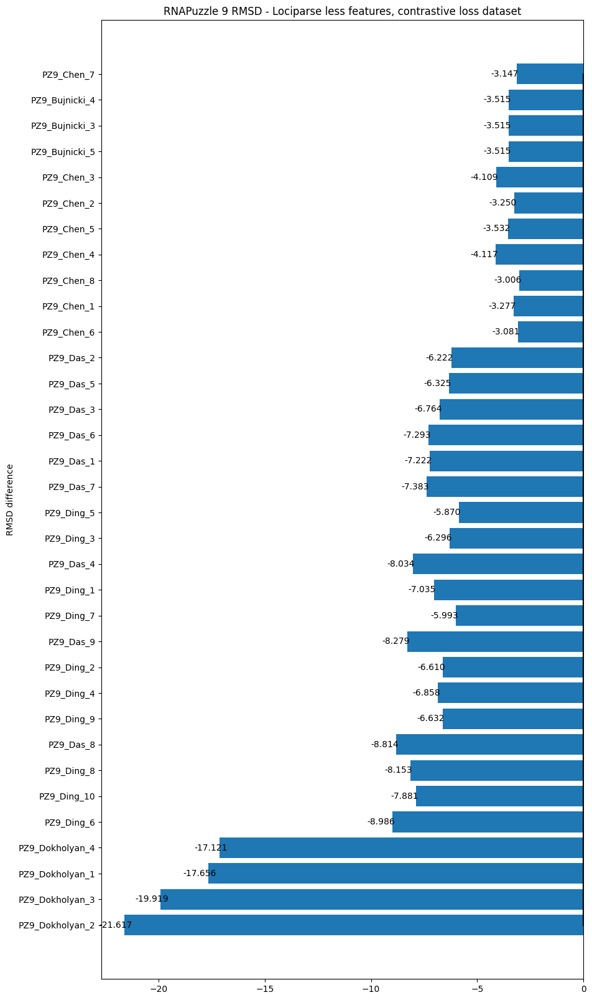

None

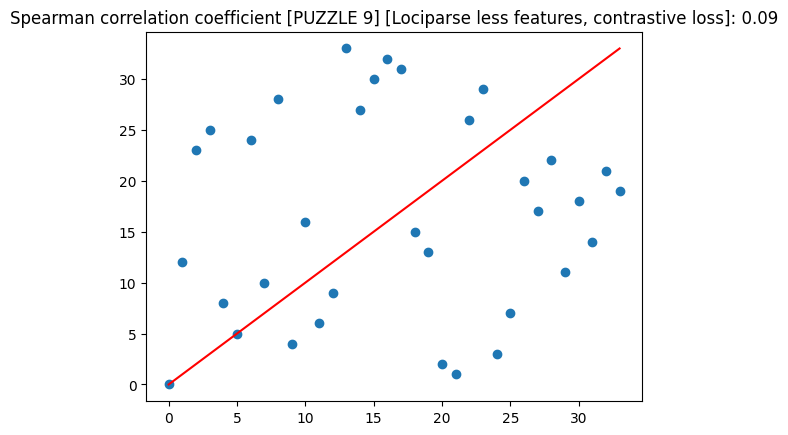

None

'PUZZLE: 38'

'MAE: 9.742093250558183'

'MSE: 109.08481786666012'

'MEDIAN: 9.785224080085753'

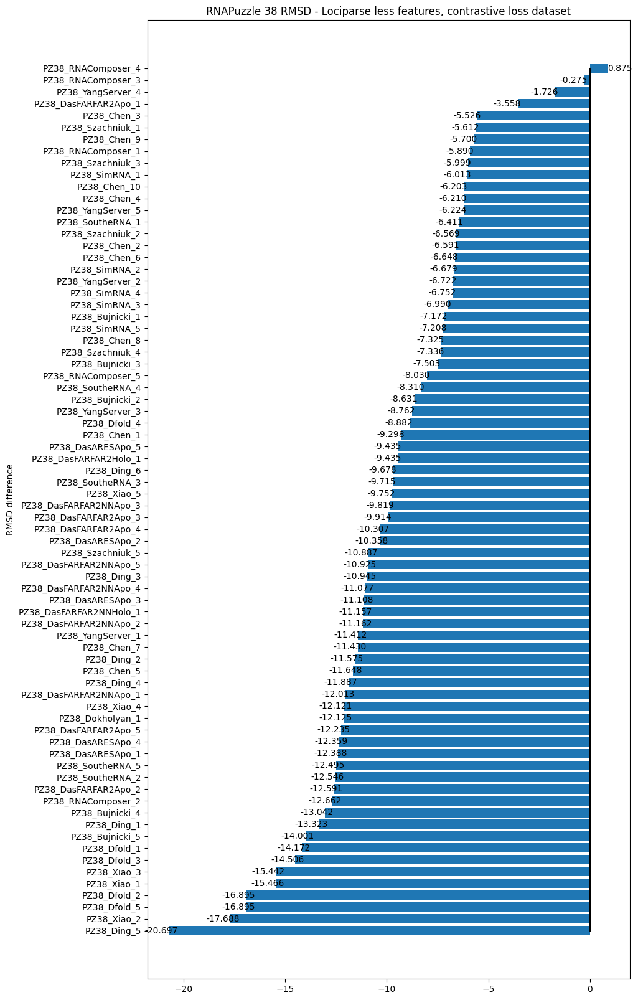

None

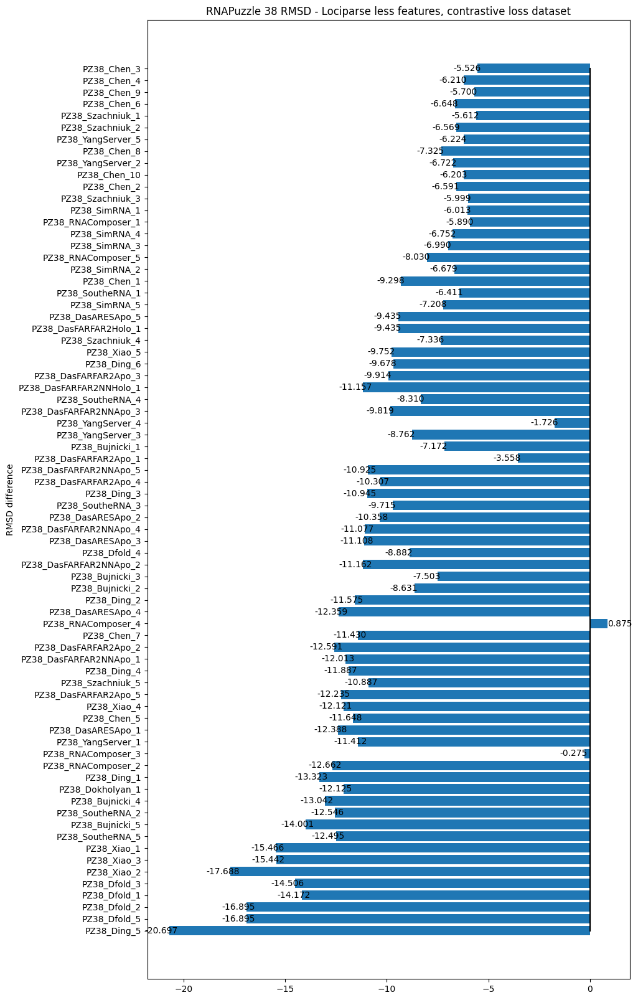

None

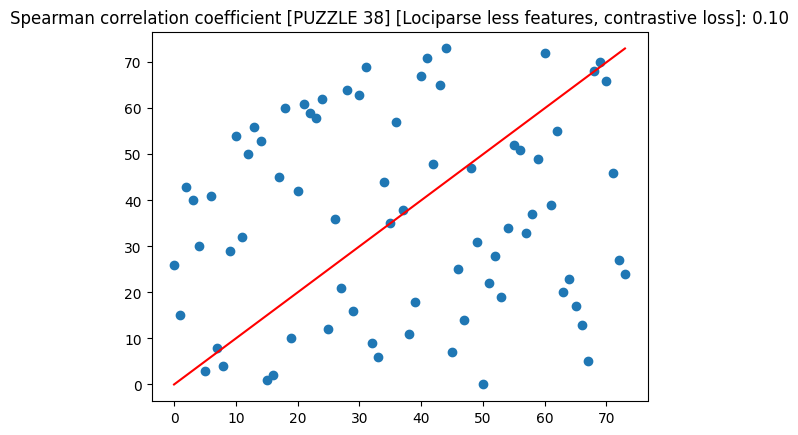

None

'PUZZLE: 28'

'MAE: 3.068719055917528'

'MSE: 25.51832602048649'

'MEDIAN: 1.8063970804214482'

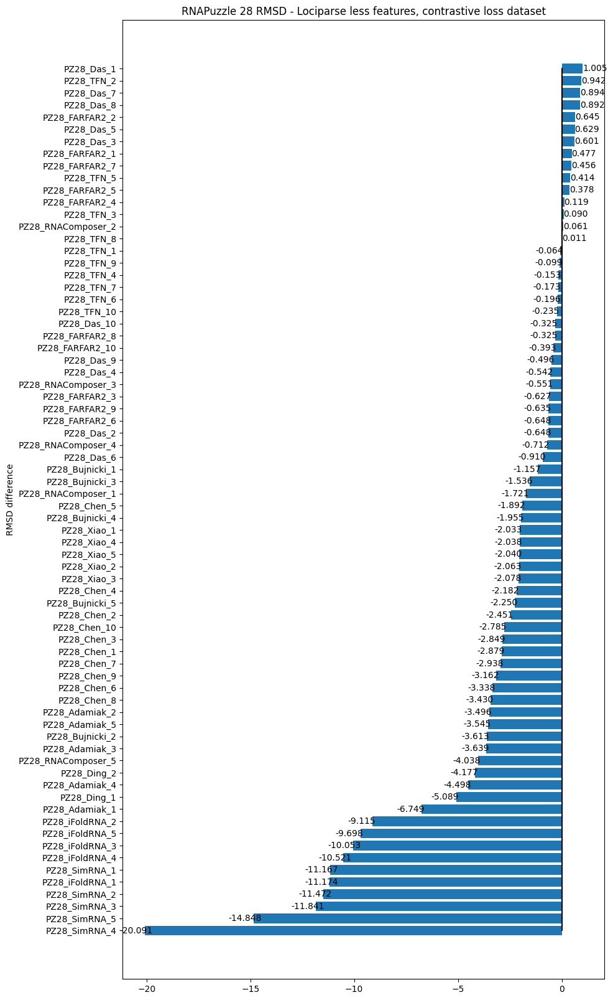

None

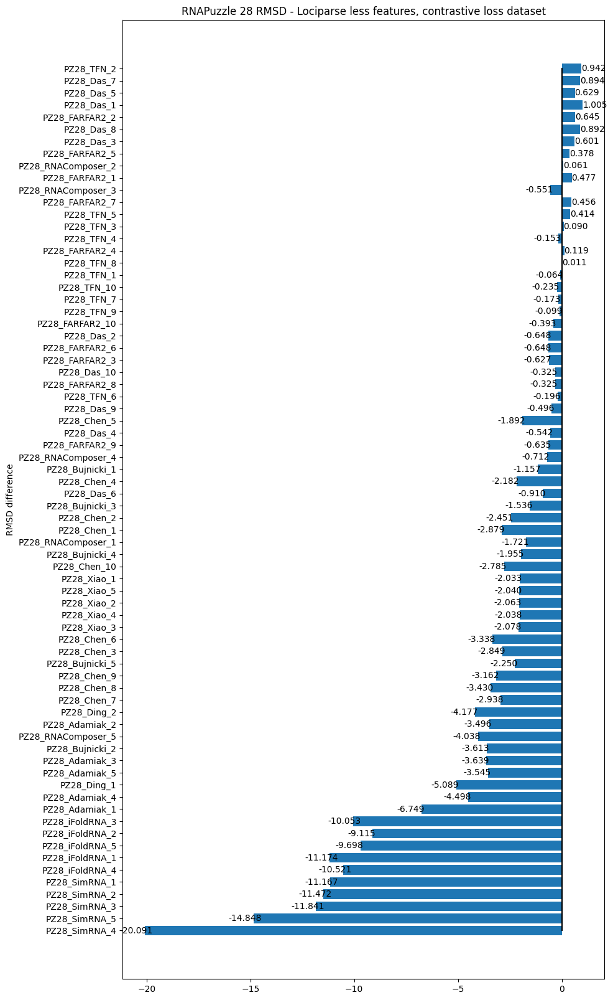

None

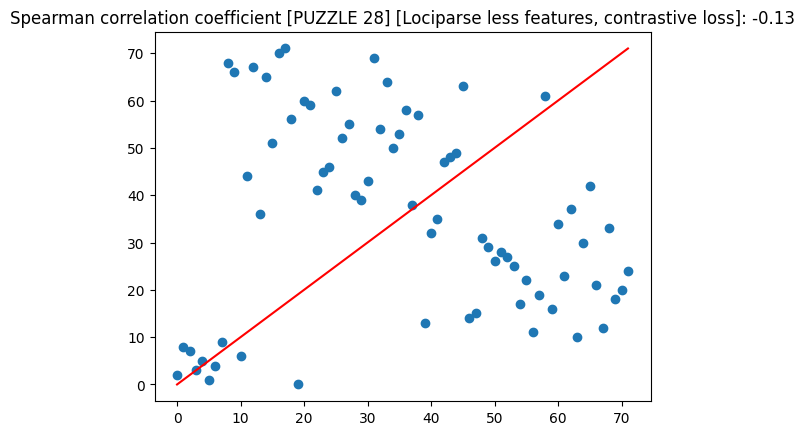

None

'PUZZLE: 19'

'MAE: 9.272444304773362'

'MSE: 105.139775442367'

'MEDIAN: 9.645922183990479'

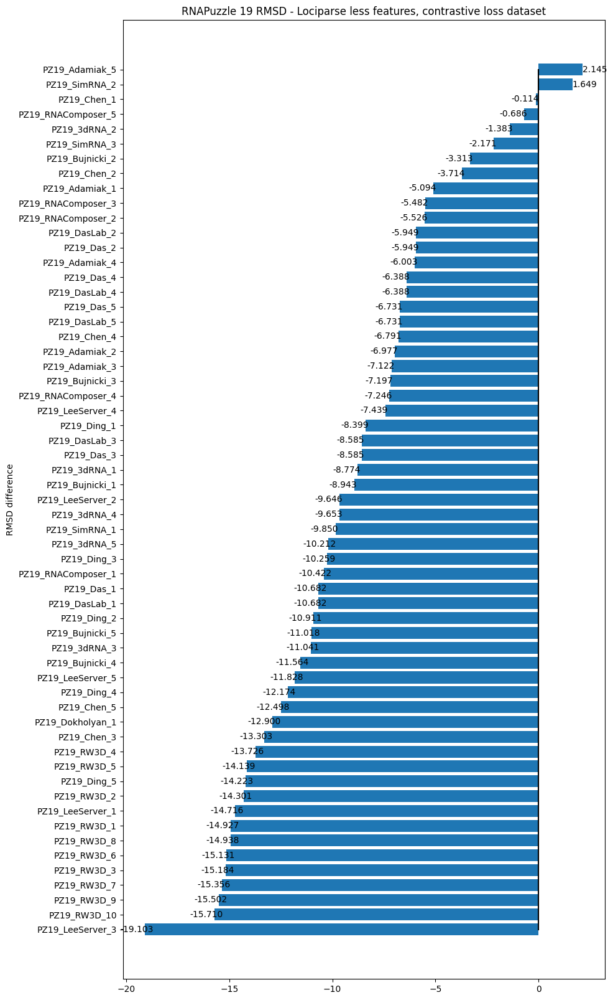

None

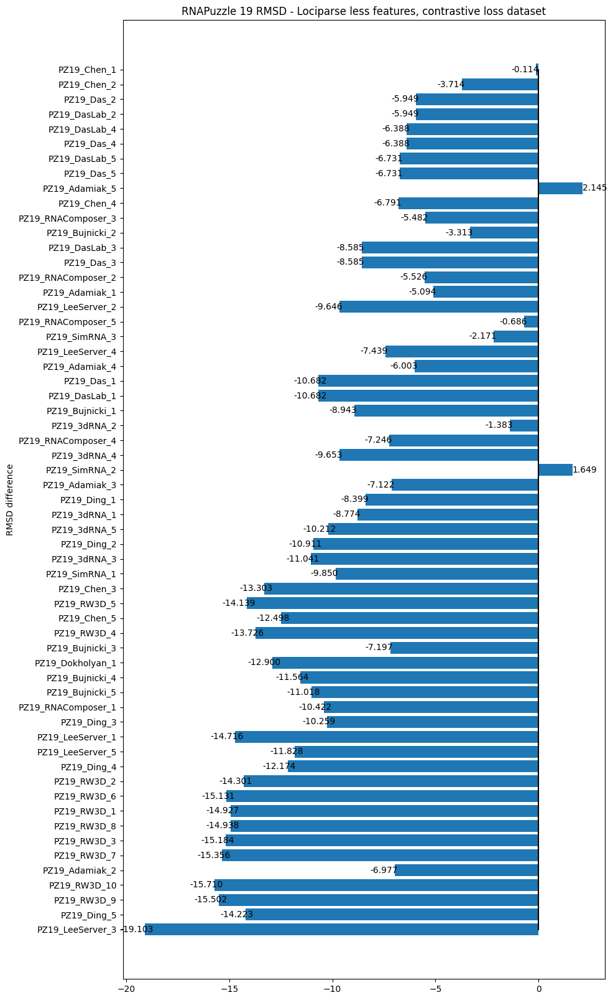

None

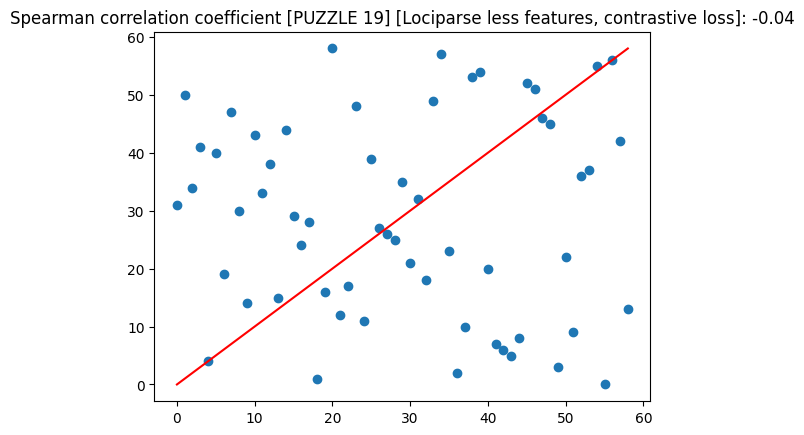

None

'PUZZLE: 36'

'MAE: 10.710789528760044'

'MSE: 141.49944387314733'

'MEDIAN: 11.92770957946778'

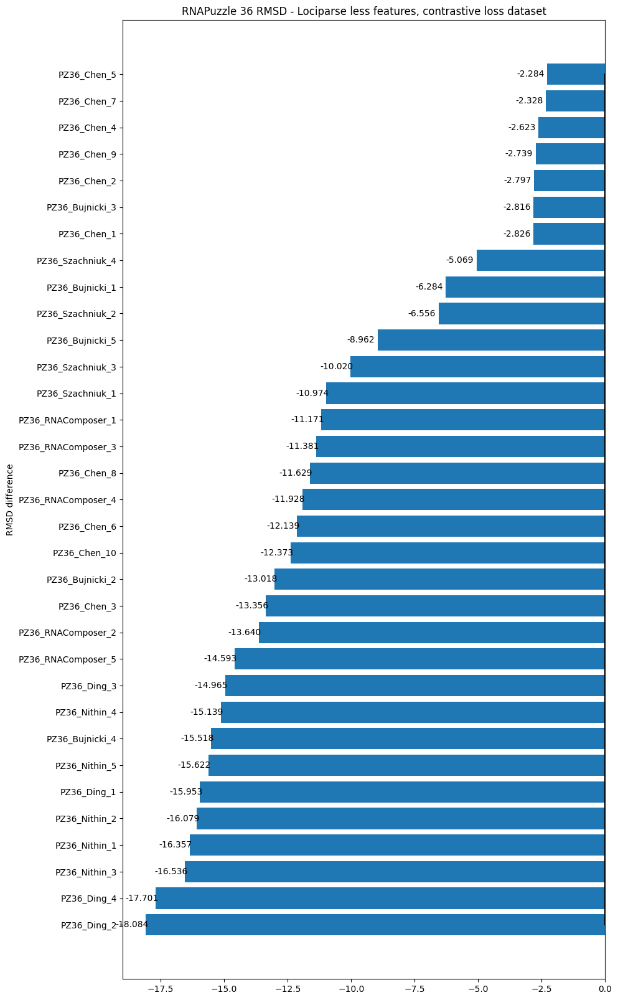

None

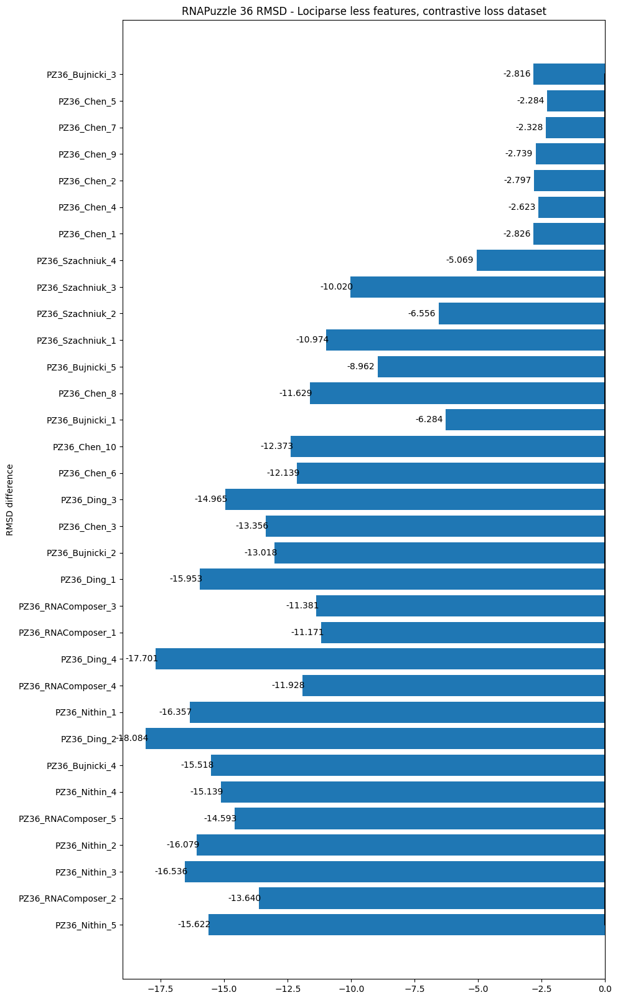

None

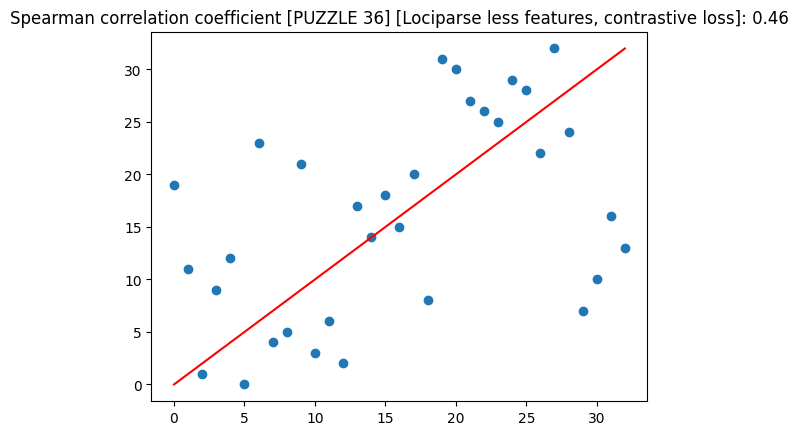

None

'PUZZLE: 21'

'MAE: 7.924142140453145'

'MSE: 93.07062696594573'

'MEDIAN: 8.233636856079103'

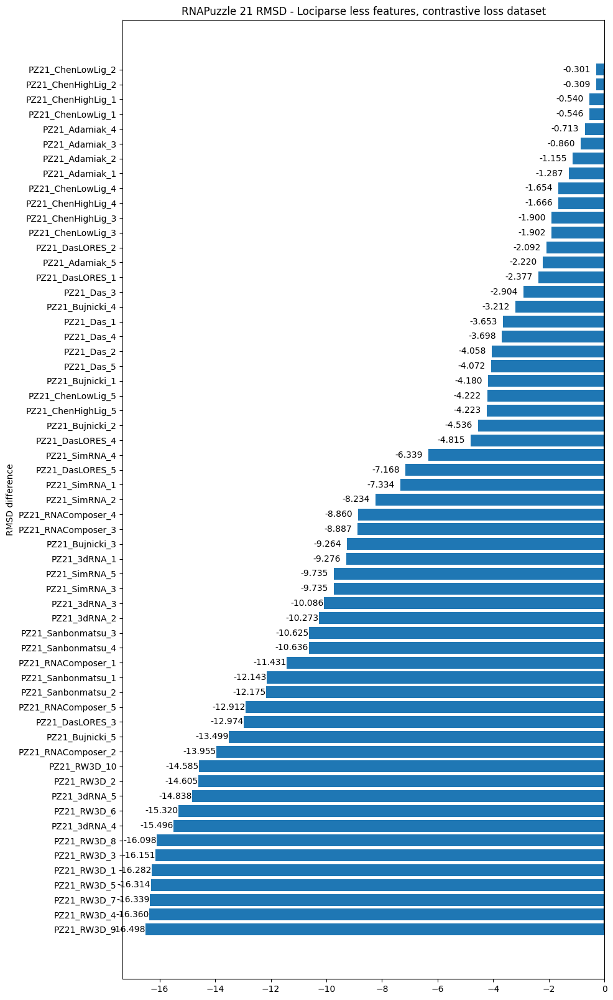

None

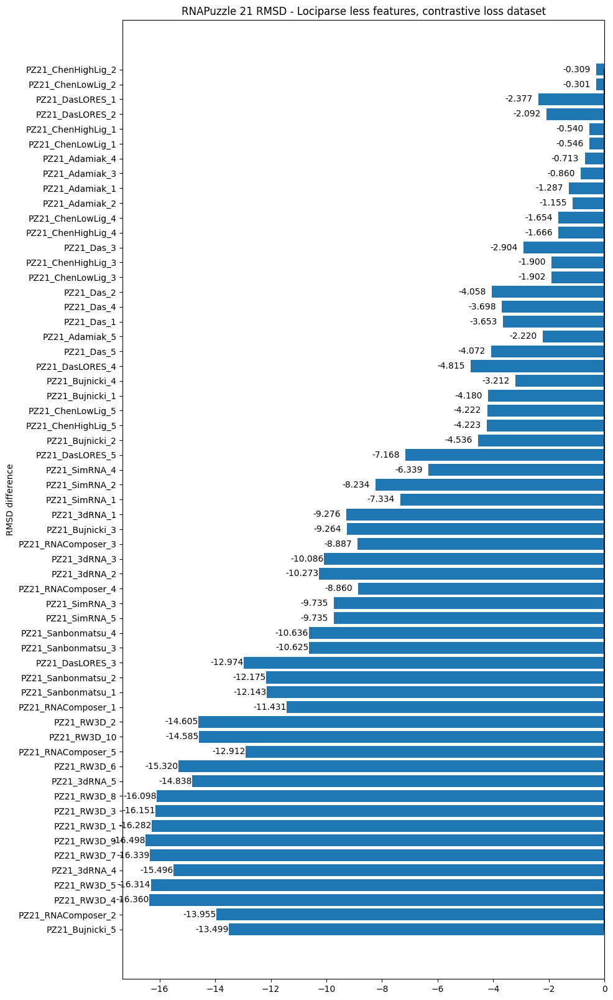

None

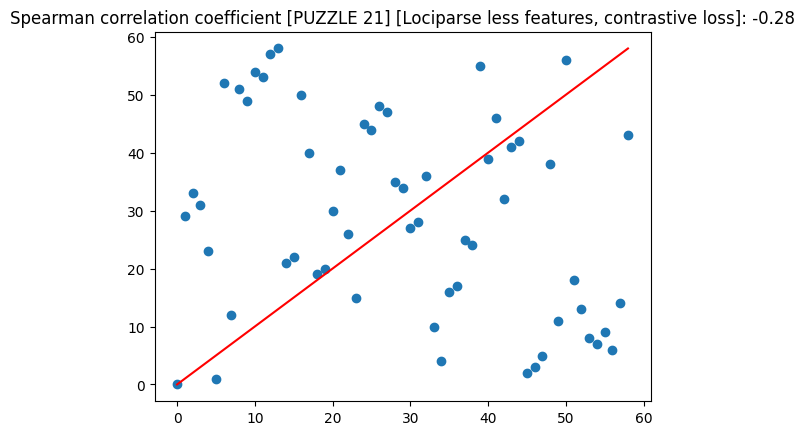

None

'PUZZLE: 23'

'MAE: 8.505836139406476'

'MSE: 79.30066752322267'

'MEDIAN: 8.737635612487793'

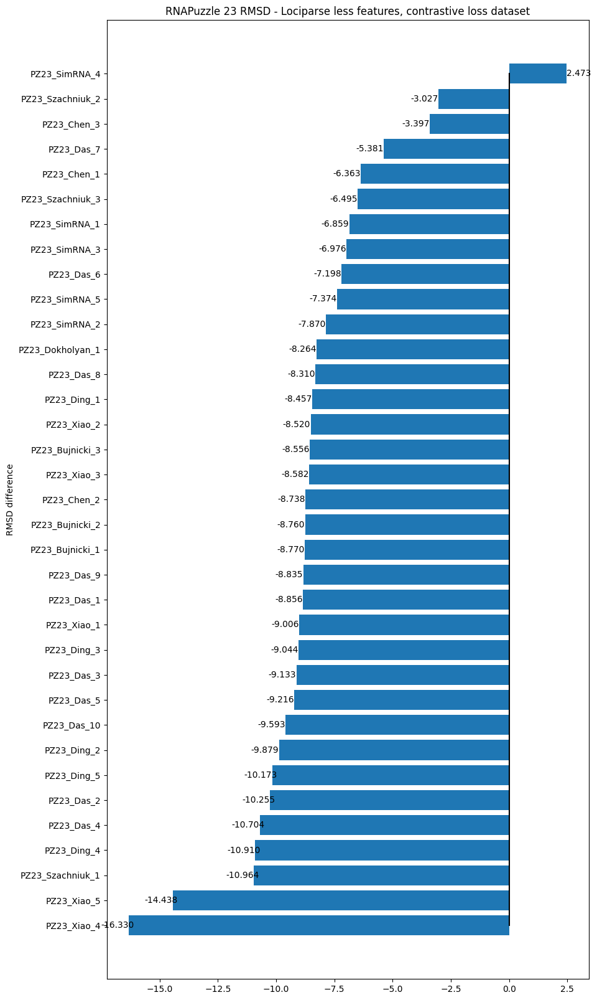

None

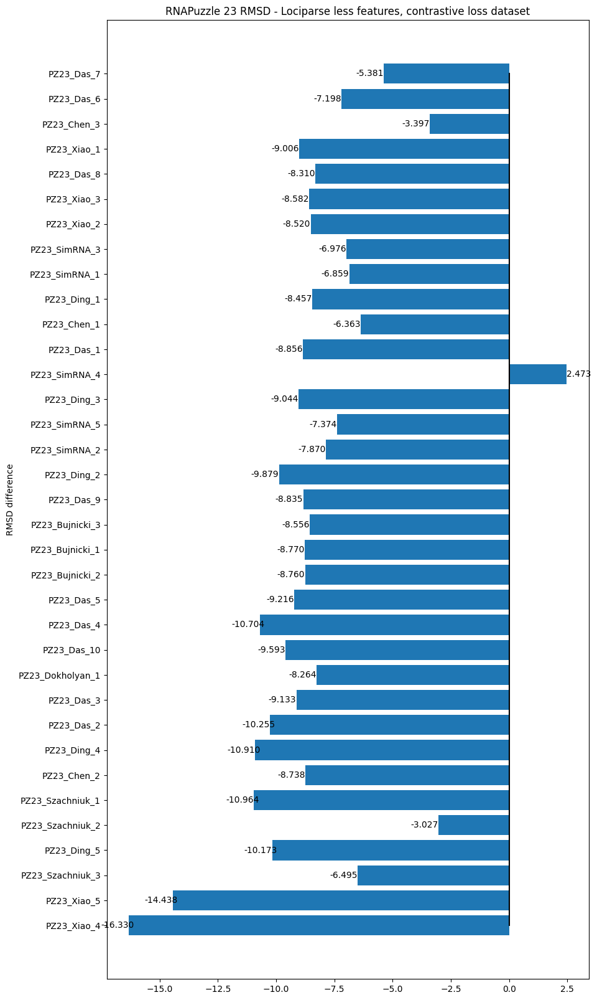

None

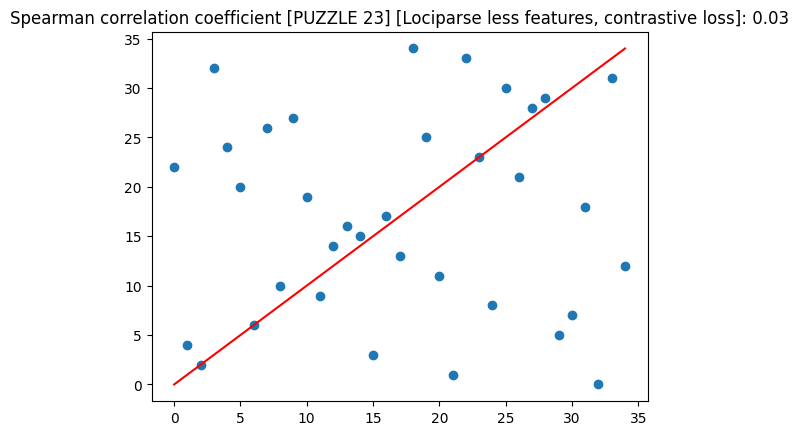

None

'PUZZLE: 15'

'MAE: 8.174438785623622'

'MSE: 95.01688303682828'

'MEDIAN: 6.225750446319584'

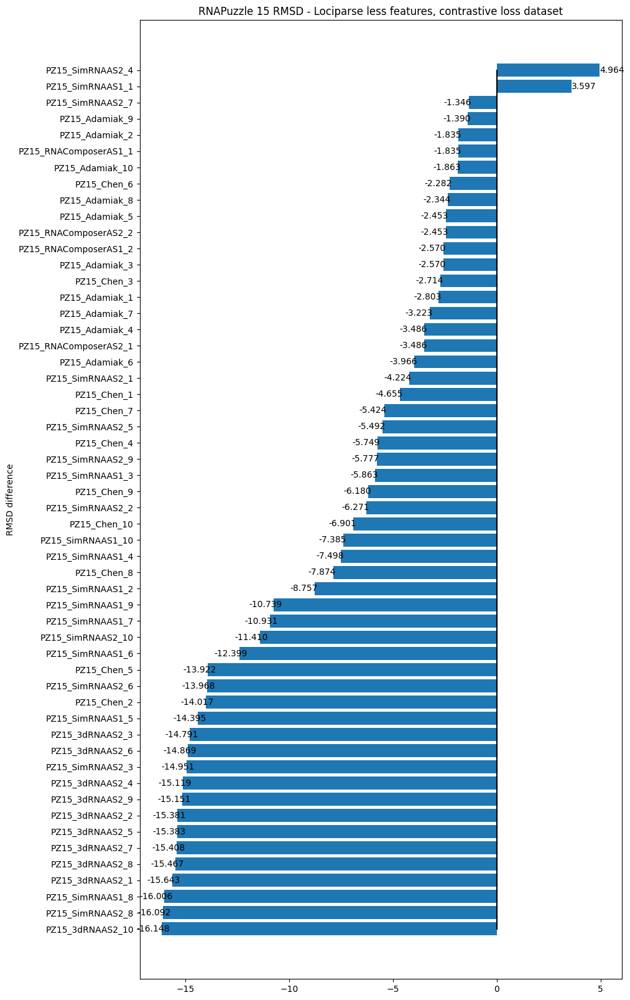

None

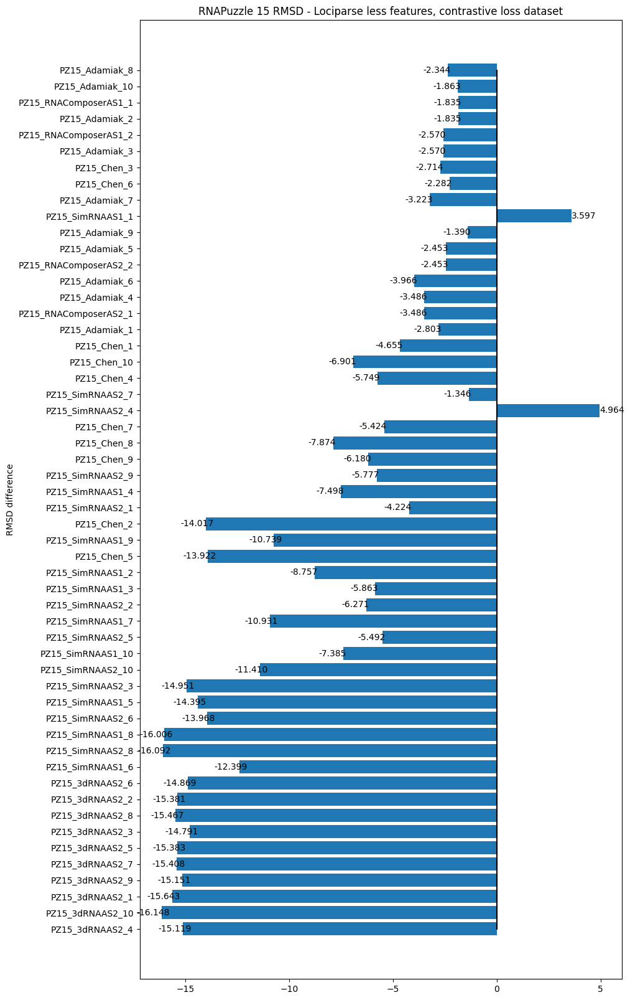

None

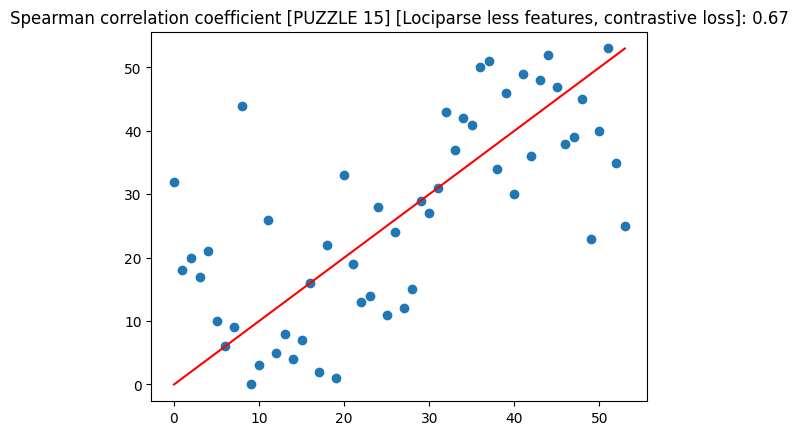

None

'PUZZLE: 14Bound'

'MAE: 9.778268732130527'

'MSE: 106.09351978511836'

'MEDIAN: 10.142671465873718'

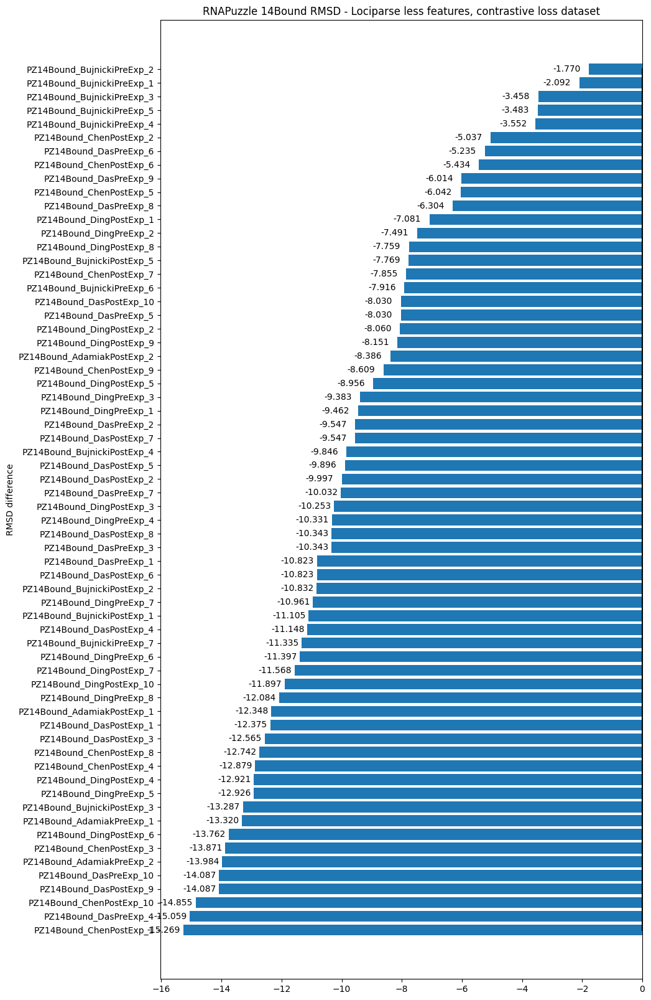

None

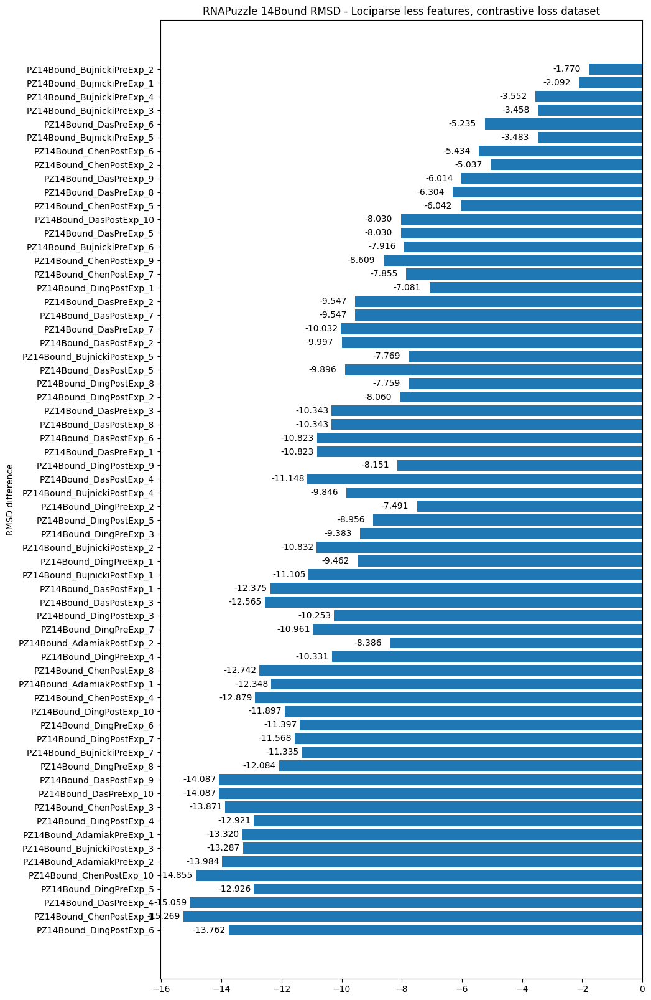

None

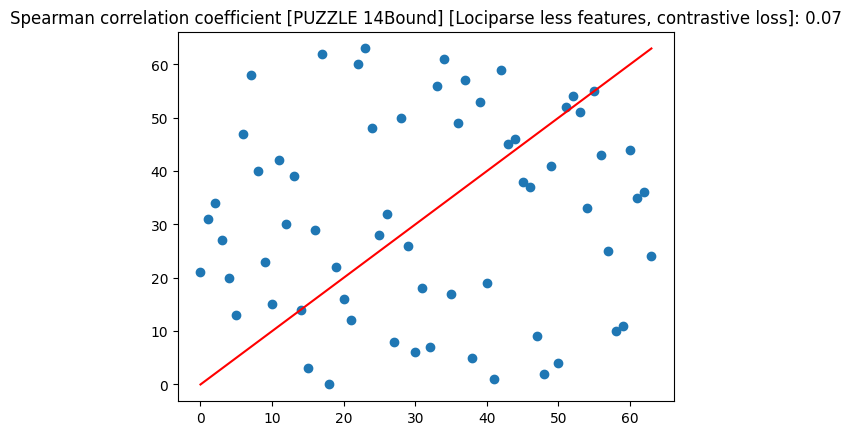

None

'PUZZLE: 29'

'MAE: 5.2565469940503435'

'MSE: 36.744532867577654'

'MEDIAN: 4.6891961097717285'

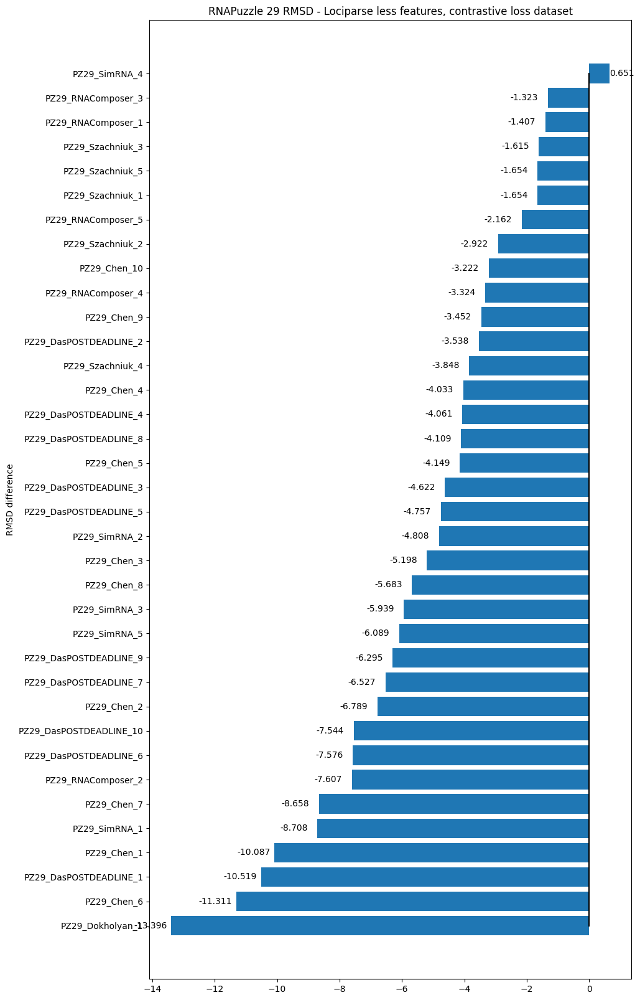

None

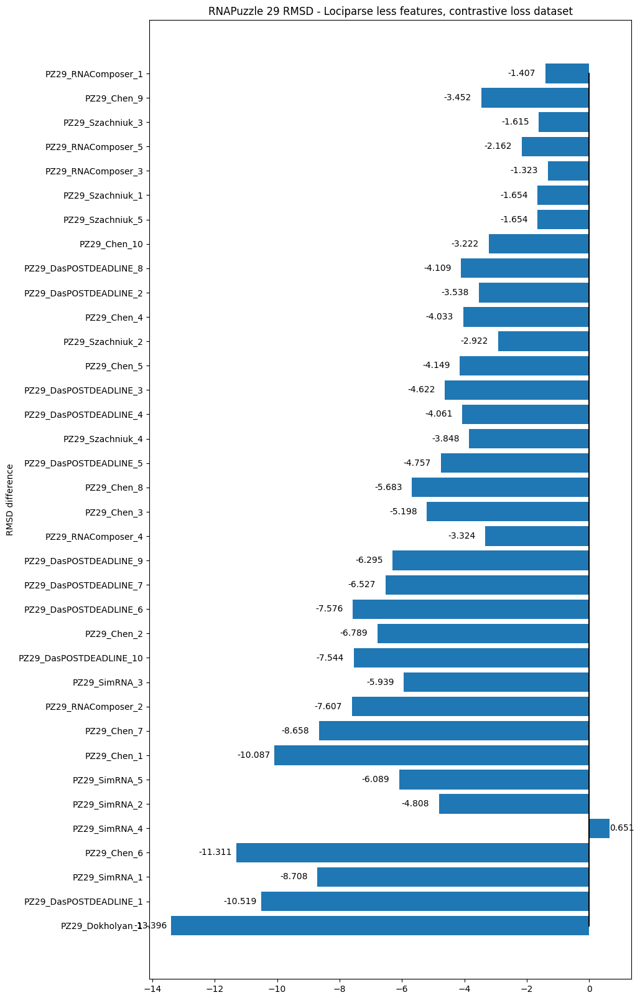

None

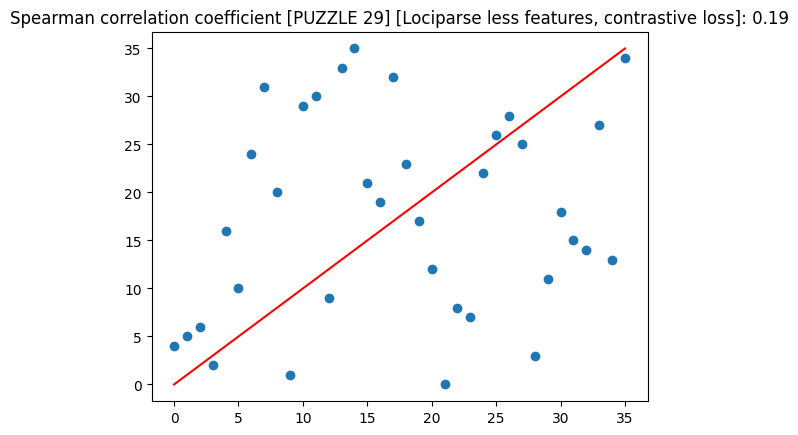

None

'PUZZLE: 20'

'MAE: 3.4584304213523867'

'MSE: 21.11717211752898'

'MEDIAN: 2.622422933578491'

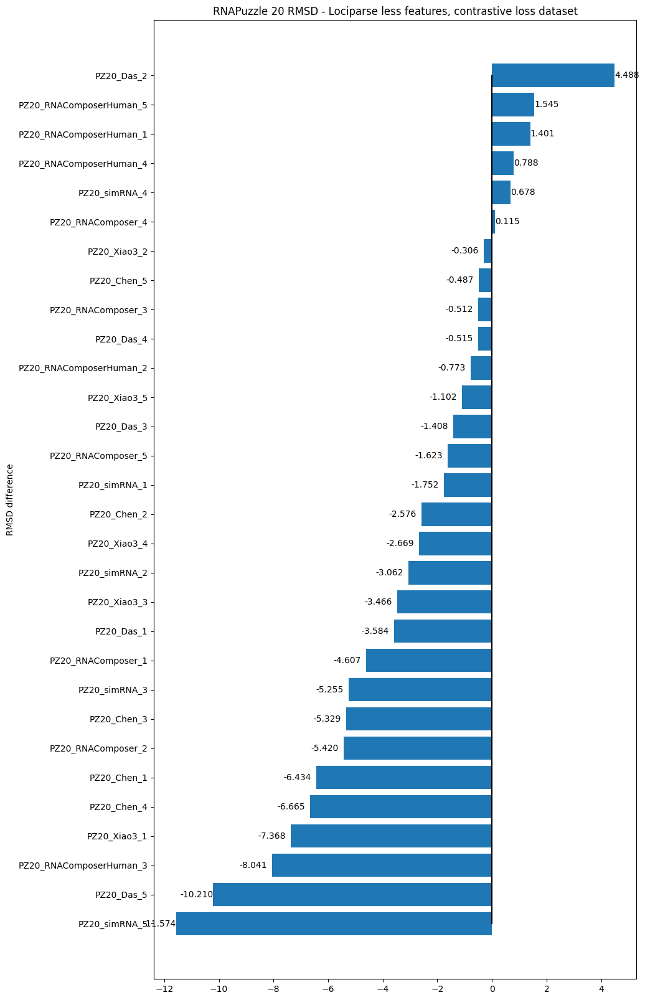

None

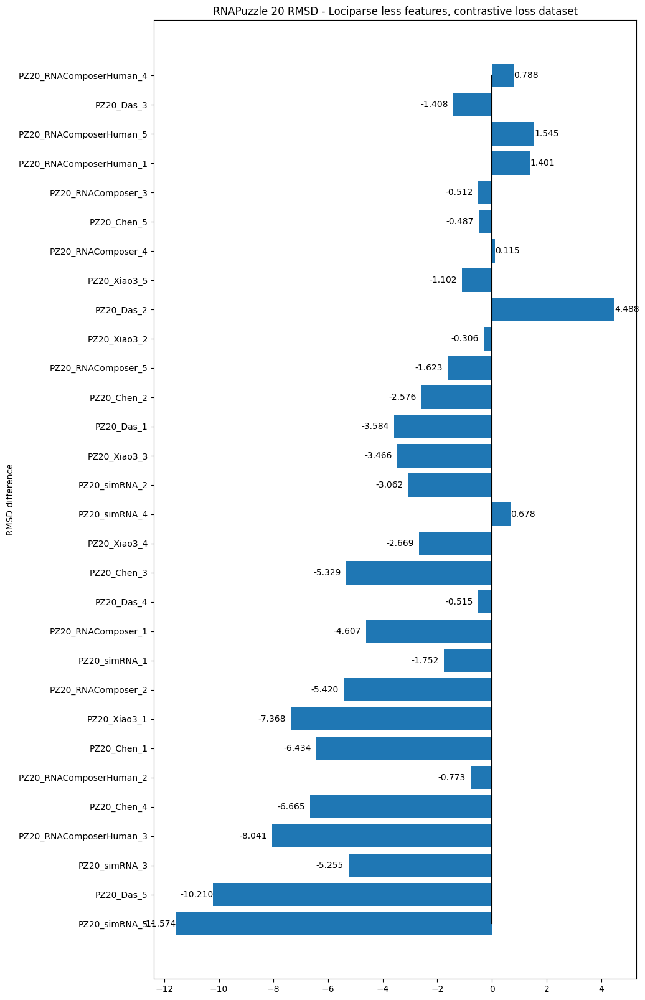

None

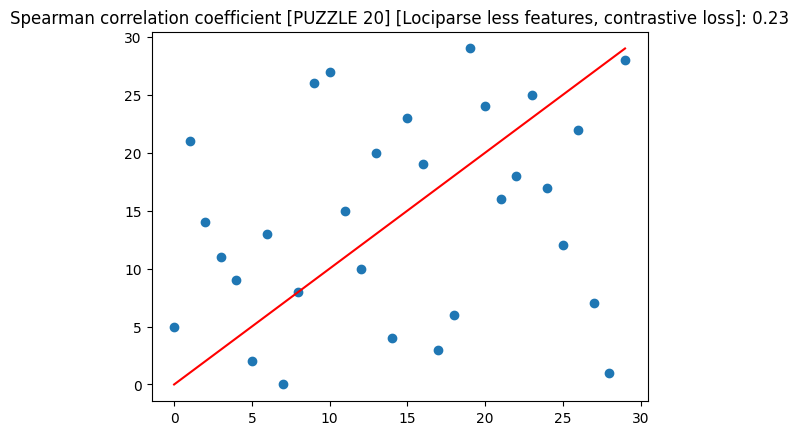

None

'PUZZLE: 4'

'MAE: 1.3945780396461487'

'MSE: 4.741664400001355'

'MEDIAN: 0.7835894823074341'

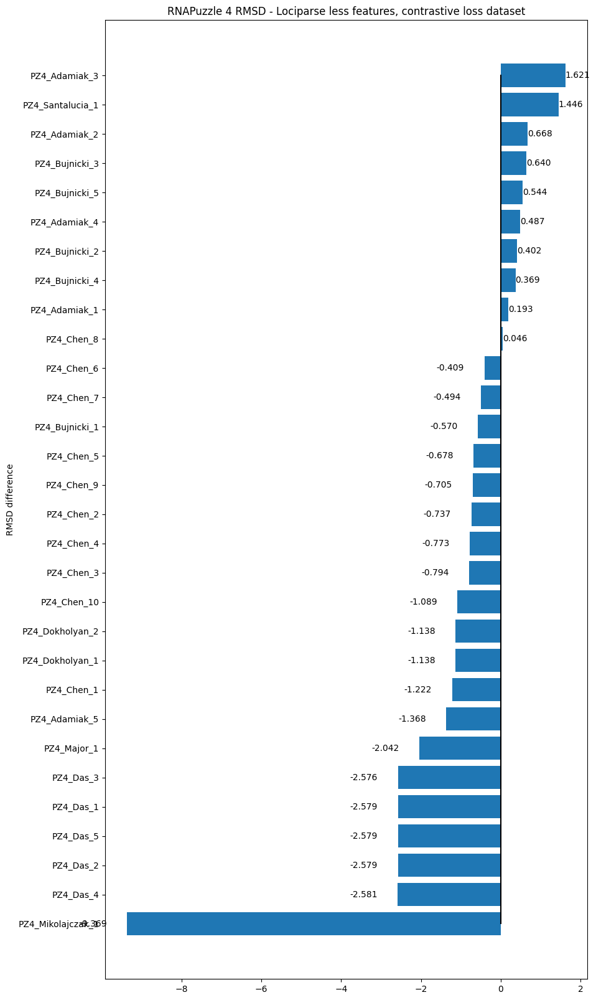

None

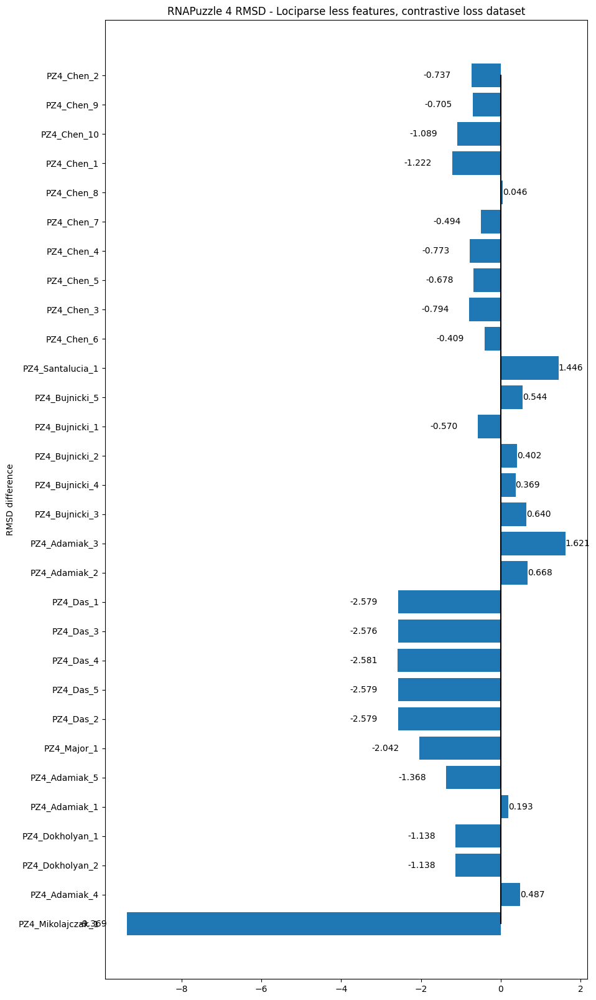

None

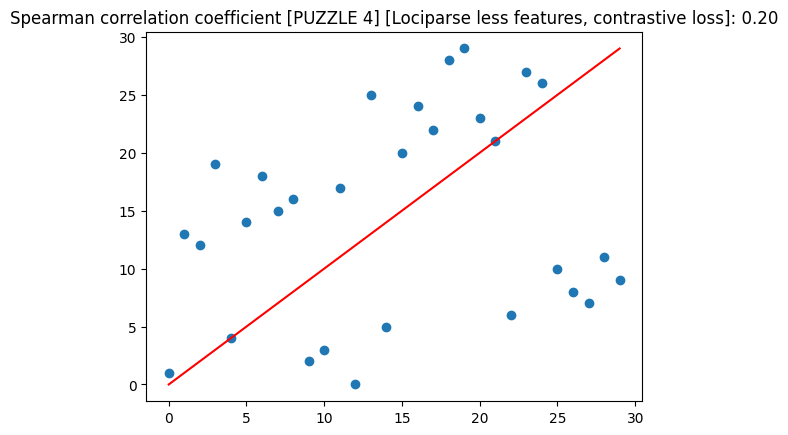

None

'PUZZLE: 1'

'MAE: 1.9708508650461833'

'MSE: 6.182408593127984'

'MEDIAN: 1.9392491579055786'

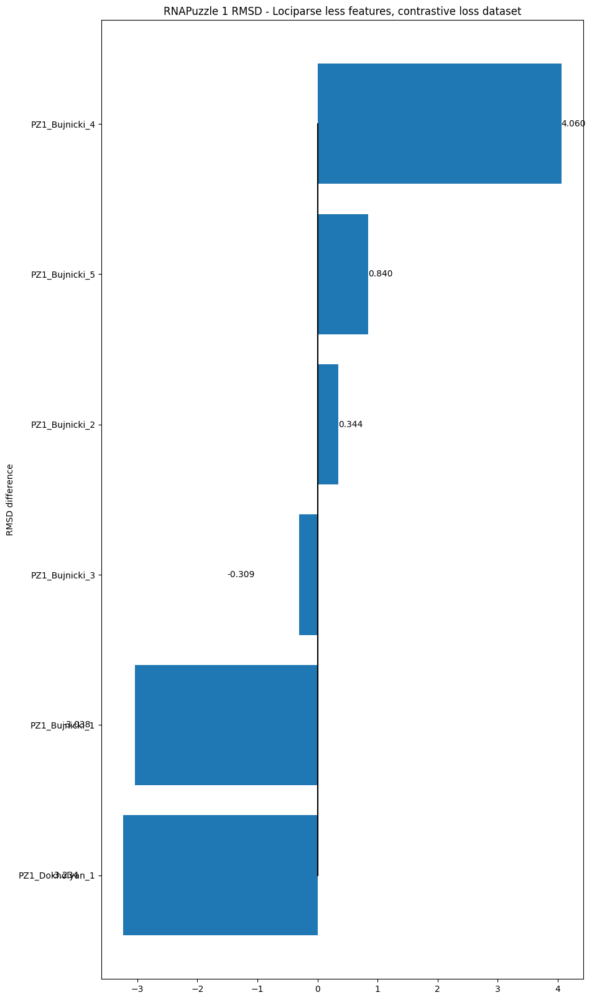

None

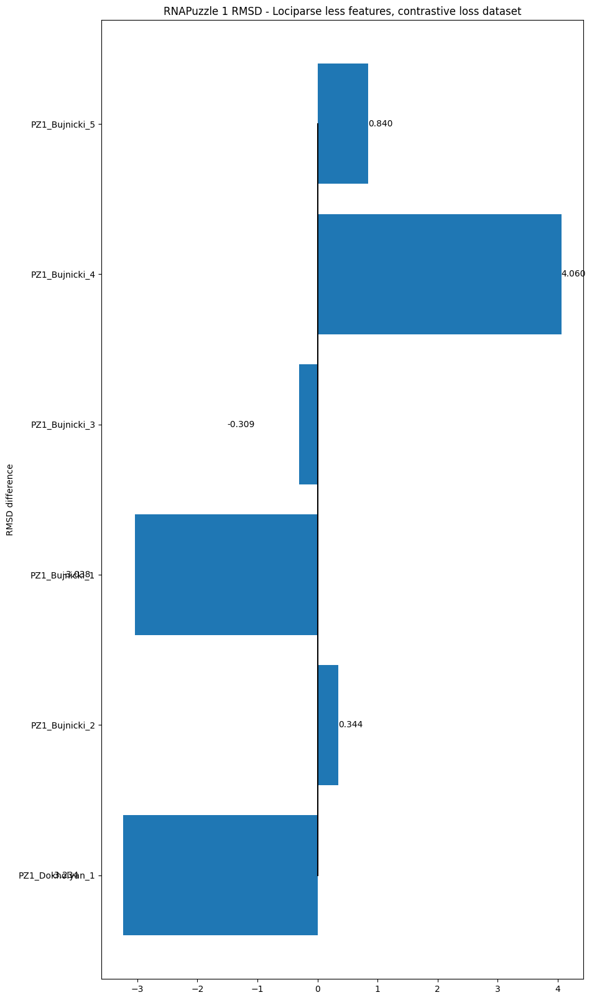

None

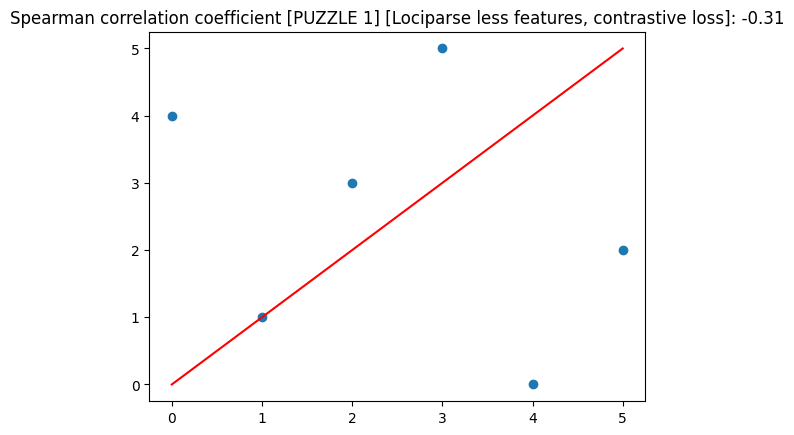

None

'PUZZLE: 2'

'MAE: 2.151371876398722'

'MSE: 12.784470983370037'

'MEDIAN: 0.14006876945495605'

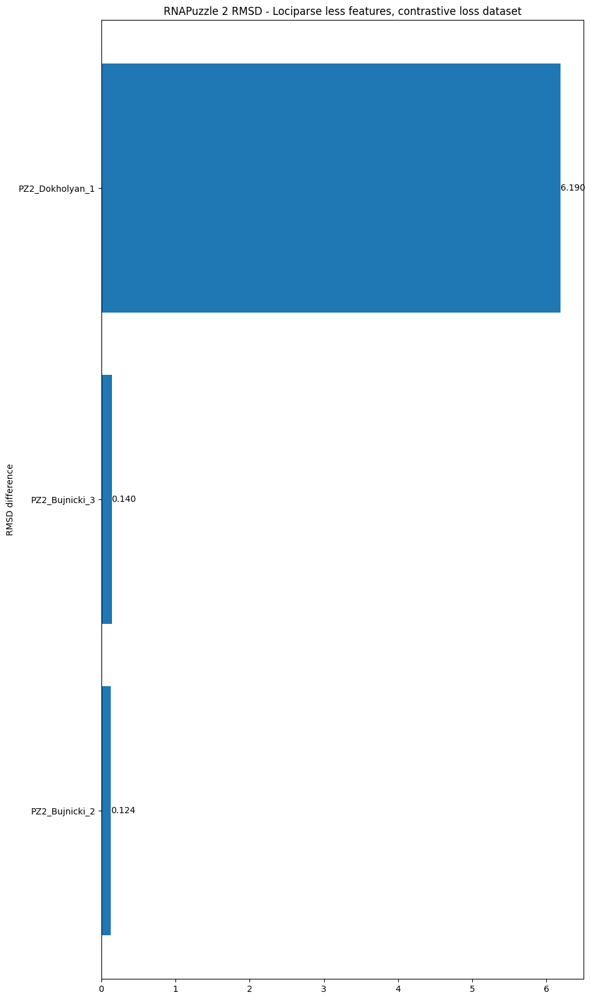

None

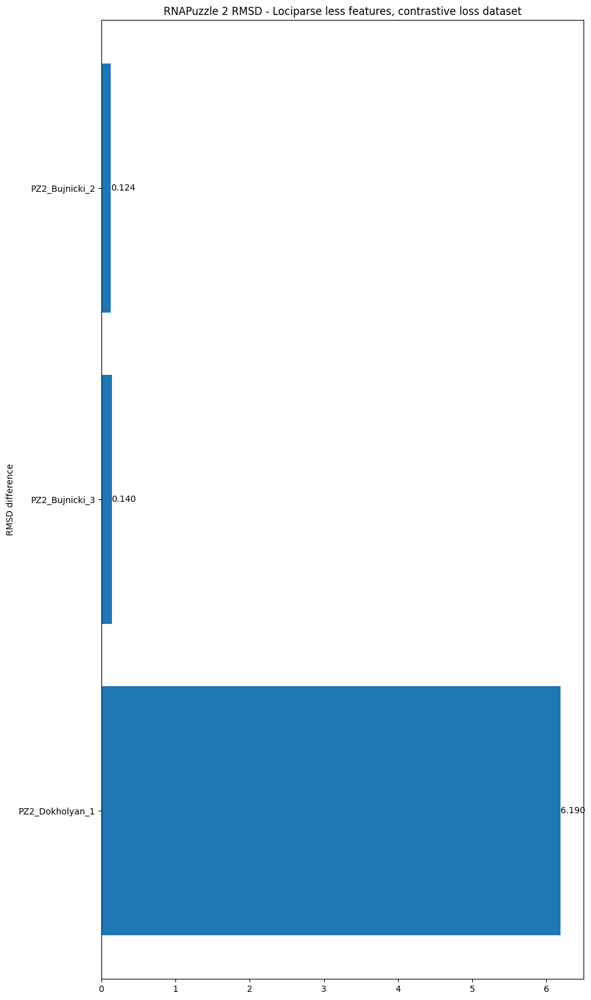

None

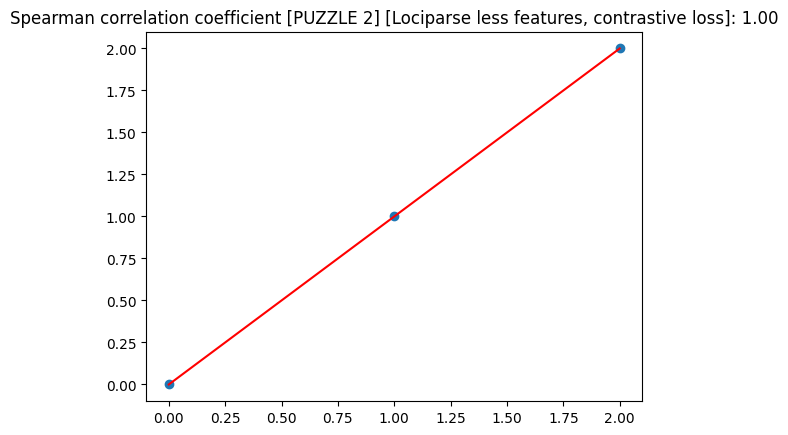

None

In [12]:
final_summary = pd.DataFrame(
    [],
    columns=[
        "MAE",
        "MSE",
        "MEDIAN",
        "PZ",
        "best_model_path",
        "model_name",
        "spearman_correlation",
    ],
)
for checkpoint in checkpoint_paths:
    by = "diff"
    best_model_path = checkpoint["best_model_path"]
    display(f"Testing {checkpoint['dataset']} with model {best_model_path}")
    result = pd.DataFrame(
        predict_and_save_results(
            dataset_test=dataset_test, best_model_path=best_model_path
        ),
        columns=["length", "error", "name"],
    )
    original = pd.read_csv(
        "/home/adamczykb/rnaquanet/data/00_reference/rnapuzzle/rnapuzzle_rmsd_complete.csv"
    )
    original["Name"] = (
        "PZ"
        + original["PZ"]
        + "_"
        + original["Lab"]
        + "_"
        + original["Num"].astype(int).astype(str).str.lower()
    )
    result = pd.merge(result, original, left_on="name", right_on="Name")
    if result.empty:
        display(f"No results for {checkpoint['dataset']}")
        raise ValueError(
            f"No results for {checkpoint['dataset']}. Please check the model and dataset."
        )
    result["RMSD"] = result["RMSD"].astype(float)
    result["error"] = result["error"].astype(float)
    result["diff"] = result["error"] - result["RMSD"]
    if not os.path.exists(f"{base_path}"):
        os.makedirs(f"{base_path}")
    result.to_csv(
        f"{base_path}/{checkpoint['dataset']}_rnapuzzle_results.csv",
        index=False,
    )
    display("GLOBAL")
    display(f"MAE: {abs(result['diff']).mean()}")
    display(f"MSE: {(result['diff']**2).mean()}")
    display(f"MEDIAN: {abs(result['diff']).median()}")
    rmsd_sorted = result.sort_values(by="RMSD").index
    error_sorted = result.sort_values(by="error").index
    final_summary = pd.concat(
        [
            final_summary,
            pd.DataFrame(
                [
                    [
                        abs(result["diff"]).mean(),
                        (result["diff"] ** 2).mean(),
                        abs(result["diff"]).median(),
                        "GLOBAL",
                        # result["PZ"].unique()[0],
                        checkpoint["dataset"],
                        best_model_path,
                        stats.spearmanr(
                            rmsd_sorted,
                            error_sorted,
                        ).statistic,
                    ]
                ],
                columns=[
                    "MAE",
                    "MSE",
                    "MEDIAN",
                    "PZ",
                    "model_name",
                    "best_model_path",
                    "spearman_correlation",
                ],
            ),
        ],
        ignore_index=True,
    )
    trained_on = checkpoint["dataset"]

    result = result.sort_values(by=by).reset_index(drop=True)
    # Create a bar plot
    for pz in result["PZ"].unique():
        fig, ax = plt.subplots(figsize=(10, 20))
        data_pz = result[result["PZ"] == pz].reset_index(drop=True)
        display(f"PUZZLE: {pz}")
        display(f"MAE: {abs(data_pz['diff']).mean()}")
        display(f"MSE: {(data_pz['diff']**2).mean()}")
        display(f"MEDIAN: {abs(data_pz['diff']).median()}")
        # Plot bars
        bars = ax.barh(data_pz["Name"], data_pz[by], capsize=5)

        # Rotate the y-axis data series by 90 degrees

        # Set labels
        # plt.xticks(rotation=90)
        ax.set_ylabel("RMSD difference")
        ax.plot(
            [0] * len(data_pz["Name"]),
            data_pz["Name"],
            linestyle="solid",
            linewidth=1.5,
            color="black",
        )
        ax.set_title(f"RNAPuzzle {pz} RMSD - {trained_on} dataset")
        for i in range(len(data_pz["Name"])):
            if data_pz[by][i] < 0:
                ax.text(
                    data_pz[by][i] - 1.2,
                    i,
                    "{p:.3f}".format(p=data_pz[by][i]),
                    verticalalignment="center",
                )
            else:
                ax.text(
                    data_pz[by][i],
                    i,
                    "{p:.3f}".format(p=data_pz[by][i]),
                    verticalalignment="center",
                )
        # Show plot
        if not os.path.exists(f"{base_path}/{pz}"):
            os.makedirs(f"{base_path}/{pz}")
        plt.savefig(f"{base_path}/{pz}/{trained_on}.svg")
        display(plt.show())

        fig, ax = plt.subplots(figsize=(10, 20))
        data_pz = data_pz.sort_values(by="RMSD", ascending=False).reset_index(drop=True)
        # Plot bars
        bars = ax.barh(data_pz["Name"], data_pz[by], capsize=5)

        # Rotate the y-axis data series by 90 degrees

        # Set labels
        # plt.xticks(rotation=90)
        ax.set_ylabel("RMSD difference")
        ax.plot(
            [0] * len(data_pz["Name"]),
            data_pz["Name"],
            linestyle="solid",
            linewidth=1.5,
            color="black",
        )
        ax.set_title(f"RNAPuzzle {pz} RMSD - {trained_on} dataset")
        for i in range(len(data_pz["Name"])):
            if data_pz[by][i] < 0:
                ax.text(
                    data_pz[by][i] - 1.2,
                    i,
                    "{p:.3f}".format(p=data_pz[by][i]),
                    verticalalignment="center",
                )
            else:
                ax.text(
                    data_pz[by][i],
                    i,
                    "{p:.3f}".format(p=data_pz[by][i]),
                    verticalalignment="center",
                )
        # Show plot
        plt.savefig(f"{base_path}/{pz}/{trained_on}_ordered.svg")
        display(plt.show())
        rmsd_sorted = data_pz.sort_values(by="RMSD").index
        error_sorted = data_pz.sort_values(by="error").index
        data_pz["spearman_distance_puzzle"] = abs(rmsd_sorted - error_sorted)

        plt.scatter(rmsd_sorted, error_sorted)
        plt.title(
            "Spearman correlation coefficient [PUZZLE {:s}] [{:s}]: {:.2f}".format(
                pz,
                checkpoint["dataset"],
                stats.spearmanr(rmsd_sorted, error_sorted).statistic,
            )
        )
        plt.plot(np.sort(rmsd_sorted), np.sort(error_sorted), color="red")
        plt.savefig(f"{base_path}/{pz}/{checkpoint['dataset']}_spearman.svg")
        display(plt.show())
        final_summary = pd.concat(
            [
                final_summary,
                pd.DataFrame(
                    [
                        [
                            abs(data_pz["diff"]).mean(),
                            (data_pz["diff"] ** 2).mean(),
                            abs(data_pz["diff"]).median(),
                            data_pz["PZ"].unique()[0],
                            checkpoint["dataset"],
                            best_model_path,
                            stats.spearmanr(rmsd_sorted, error_sorted).statistic,
                        ]
                    ],
                    columns=[
                        "MAE",
                        "MSE",
                        "MEDIAN",
                        "PZ",
                        "model_name",
                        "best_model_path",
                        "spearman_correlation",
                    ],
                ),
            ],
            ignore_index=True,
        )
    result.to_csv(
        f"{base_path}/{checkpoint['dataset']}_rnapuzzle_results.csv",
        index=False,
    )
    final_summary.to_csv(
        f"{base_path}/{checkpoint['dataset']}_rnapuzzle_summary.csv", index=False
    )

In [13]:
final_summary.sort_values('spearman_correlation', ascending=False)

,MAE,MSE,MEDIAN,PZ,best_model_path,model_name,spearman_correlation
22,2.151372,12.784471,0.140069,2,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,"Lociparse less features, contrastive loss",1.000000
16,8.174439,95.016883,6.225750,15,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,"Lociparse less features, contrastive loss",0.674633
4,20.003874,411.894709,20.492916,22,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,"Lociparse less features, contrastive loss",0.464662
13,10.710790,141.499444,11.927710,36,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,"Lociparse less features, contrastive loss",0.463904
3,11.343567,166.866755,9.890415,32,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,"Lociparse less features, contrastive loss",0.450276
2,12.154284,181.592795,13.656977,35,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,"Lociparse less features, contrastive loss",0.373756
1,22.087690,517.162006,21.682904,7,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,"Lociparse less features, contrastive loss",0.313156
8,11.674932,174.166012,12.127103,18,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,"Lociparse less features, contrastive loss",0.305432
6,3.513576,26.263735,2.540169,25,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,"Lociparse less features, contrastive loss",0.264223
5,10.258366,122.851311,9.350363,8,/home/adamczykb/rnaquanet/checkpoints/RNAQuANe...,"Lociparse less features, contrastive loss",0.236529
